In [1]:
import numpy as np
import pandas as pd
import Bio
from Bio import PDB
from Bio.PDB import PDBParser
from Bio.PDB import PDBIO
import matplotlib.pylab as plt
import matplotlib
import os
from os import listdir
from os.path import isfile, join, isdir
from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern'], 'size' : 12})
rc('text', usetex=True)
import pandas as pd
from sklearn import metrics
from numpy.linalg import norm
from scipy.stats import spearmanr, pearsonr, kendalltau
import pickle
import re
from sklearn import svm
from sklearn.decomposition import PCA
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import glob
%matplotlib inline

# Some basic functions for the code to run

In [2]:
def create_prob_dist_identical_bins(data, fig, ax, bins = [], n_bins = 100, color = "black", label = None, alpha = 1.0, marker = "o"):
    '''
    plots a probability distribution from the data provided
    '''
    if bins == []:
        bins = np.linspace(min(data),max(data),n_bins)
        bin_range = abs(bins[1]-bins[0])
        bins = np.array([min(bins)-bin_range] + list(bins) + [max(bins) + bin_range])
    
    n, bins, patches = ax.hist(data, bins=bins, density=True, histtype= "step", alpha = 0)
    bins = np.delete(bins, -1)
    bins += abs(bins[1]-bins[0])/2
    
    
    ax.plot(bins, n, marker=marker, color=color, markerfacecolor='none', label = label, alpha = alpha)
    
    x = np.array(bins)
    y = np.array(n)
    
    return x, y

# Load in the supersampled and nonsupersampled main datasets

In [3]:
os.chdir("/Users/jakesumner/Desktop/PPI Project/supersampling/final_manuscript_datasets")

ss_corr_df = pd.read_csv("supersampled_correlation_dataset_final_manuscript.csv")
relaxed_corr_df = pd.read_csv("non_supersampled_correlation_dataset_final_manuscript.csv")

In [4]:
## Load in the supersampled balanced dataset for each target

ss_balanced_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/all_supersampled_balanced_datasets"
os.chdir(ss_balanced_dir)

pdb_list = list(ss_corr_df["pdb"])

all_csv_files = sorted([f for f in listdir(ss_balanced_dir) if isfile(join(ss_balanced_dir, f)) and ".csv" in f and f[:4] in pdb_list])

ss_score_dict = {}
for csv_file in all_csv_files:
    pdb_name = csv_file[:4]
    ss_score_dict[pdb_name] = pd.read_csv(csv_file)

In [5]:
## Load in the pickle data

os.chdir("/Users/jakesumner/Desktop/PPI Project/")

with open("subsampling_400.pickle", "rb") as f:
    subsampling_400 = pickle.load(f)
    
with open("subsampling_200.pickle", "rb") as f:
    subsampling_200 = pickle.load(f)
    
with open("subsampling_100.pickle", "rb") as f:
    subsampling_100 = pickle.load(f)
    
with open("subsampling_50.pickle", "rb") as f:
    subsampling_50 = pickle.load(f)

### Non-supersampled original 500 Zdock run

In [6]:
not_supersampled_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/final_manuscript_all_unsupersampled_scores"
os.chdir(not_supersampled_dir)

all_csv_files = sorted([f for f in listdir(not_supersampled_dir) if isfile(join(not_supersampled_dir, f)) and ".csv" in f and f[:4] in pdb_list])

zdock_relaxed_combined_dfs = {}
for csv_file in all_csv_files:
    pdb_name = csv_file[:4]
    zdock_relaxed_combined_dfs[pdb_name] = pd.read_csv(csv_file)

## Load the exhaustive sampling data

In [7]:
exhaustive_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/exhaustive_all_targets"

os.chdir(exhaustive_dir)

exhaustive_corr_df = pd.read_csv("exhaustive_correlation_dataframe.csv")

exhaustive_score_dict = {}

csv_files = glob.glob("*exhaustive_scores.csv")

for pdb_file in csv_files:
    pdb_name = pdb_file[:4]
    temp_df = pd.read_csv(pdb_file)
    
    exhaustive_score_dict[pdb_name] = temp_df


### Target Score Dataframe

In [8]:
os.chdir("/Users/jakesumner/Desktop/PPI Project/supersampling")

target_file = "all_89_target_scores.txt"

temp_dict = {
    "pdb" : [],
    "ZRank" : [],
    "HDOCK" : [],
    "Rosetta" : [],
    "PyDock" : [],
    "VoroMQA" : []
}

first = True
keys = list(temp_dict.keys())
with open(target_file, "r") as f:
    for line in f:
        if first:
            first = False
            continue
            
        temp_vals = line.split()
        for i in range(len(temp_vals)):
            try:
                temp_dict[keys[i]].append(float(temp_vals[i]))
            except:
                temp_dict[keys[i]].append(temp_vals[i])
            
f.close()

target_score_df = pd.DataFrame(temp_dict)

ones = np.ones((89))
target_score_df["DockQ"] = ones
target_score_df["IS-Score"] = ones

In [9]:
## Figure 2 data loading

os.chdir("/Users/jakesumner/Desktop/PPI Project/supersampling/final_manuscript_datasets")

fig_2_1xg2_df = pd.read_csv("1xg2_relaxed_unsupersampled_data.csv")

with open("dockq_distribution_not_ss_energy_minimized.pickle", "rb") as f:
    avg_dockq_bins_relax = pickle.load(f)
    
with open("dockq_distribution_ss_after_energy_minimization.pickle", "rb") as f:
    after_dockq_mean = pickle.load(f)
    
with open("dockq_distribution_ss_before_energy_minimization.pickle", "rb") as f:
    before_dockq_mean = pickle.load(f)

## Figure Save Directory

In [10]:
figure_save_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/final_manuscript_figures"

In [11]:
all_pdbs = set(list(ss_corr_df["pdb"]))
grace_pdbs = set(['1spp', '3qc8', '2d5r', '1ka9', '3ona', '2wmp', '1itb', '2hth', '2hsm', '1kfu', '1ggp', '1pdk', '2hla', '2pe6', '1c3a', '2dvw', '3gfk', '2oul', '1tfo', '2nts', '1brb', '3k9p'])
jake_pdbs = all_pdbs - grace_pdbs
grace_pdbs = all_pdbs - jake_pdbs

print(sorted(list(grace_pdbs)))

['1c3a', '1ggp', '1itb', '1kfu', '1pdk', '1spp', '1tfo', '2d5r', '2dvw', '2hla', '2hsm', '2hth', '2oul', '2pe6', '2wmp', '3gfk', '3k9p', '3ona', '3qc8']


## Figure 1

In [12]:
## Read in the data

home_score_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/3rcz_exhaustive_sampling_test"
os.chdir(home_score_dir)

exhaustive_3rcz_df = pd.read_csv("exhaustively_sampled_3rcz.csv")

home_score_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/3ygs_exhaustive_sampling_test"
os.chdir(home_score_dir)

exhaustive_3ygs_df = pd.read_csv("exhaustively_sampled_3ygs.csv")

In [13]:
def make_hit_rate_plot_sample(sample_list, column = "ZRank", top_ranks = 50, dockq_cutoff = 0.23):
    '''
    Makes a hit rate plot from the score_dict. Hit rate is calculated based
    on the column name provided and the hit rate plot is calculated up to the
    top_ranks specified
    '''
    
    hit_rate_final = np.zeros((len(sample_list),top_ranks)) ## Create the hit rate plot y_axis
    hit_rate_x = range(1,top_ranks + 1)
    
    for i,temp_df in enumerate(sample_list):
        score_vals = np.array(temp_df[column]) ## gets the score column for each PDB
        dockq_vals = np.array(temp_df["DockQ"]) ## gets all of the CAPRI scores for the minimum
        
        ## Sorting the dataframes
        sort_vals = np.argsort(score_vals)
        score_vals = score_vals[sort_vals]
        dockq_vals = dockq_vals[sort_vals]
        
        hit_bool = False ## controls whether you found a positive
        for j in range(top_ranks):
            if dockq_vals[j] >= dockq_cutoff:
                ## Positive has been found in the top_ranks
                hit_bool = True
            if hit_bool:
                hit_rate_final[i,j] = 1
            else:
                hit_rate_final[i,j] = 0
                
    return np.mean(hit_rate_final, axis = 0), hit_rate_x


def sample_for_hit_rate_test(score_df, sample_list, top_ranks = 100, score_col = "ZRank"):
    '''
    Make a hit rate plot for each sample size in the sample
    list. Return a list of hit rate plot lists in the top_ranks. 
    '''
    
    ## Define DockQ Cutoff to use
    
    dockq_cutoff = 0.23
    
    ## init list to save hit rate data
    
    all_hit_rate_plots = []
    
    for n_samples in sample_list:
        
        temp_sample_list = []
        
        for i in range(1000):
            
            ## Get the random sample of the dataframe - no replacement
        
            temp_random_df = score_df.sample(n = n_samples, replace = False)
            
            temp_sample_list.append(temp_random_df)
            
        ## Get the hit rate and append to the list
        
        hit_rate_data, x_ax_vals = make_hit_rate_plot_sample(temp_sample_list, column = score_col,
                                                             top_ranks = top_ranks, dockq_cutoff = dockq_cutoff)
        all_hit_rate_plots.append(hit_rate_data)
        
    return all_hit_rate_plots 
        
            

In [14]:
print(len(ss_score_dict["1acb"]))

1394


In [15]:
## Run the samples

sample_list = [500, 1000, 2000, 5000, 10000, 15000]

score_fxn = 'Rosetta'

sampled_hit_data_3rcz = sample_for_hit_rate_test(exhaustive_3rcz_df, sample_list, score_col = score_fxn)

sampled_hit_data_3ygs = sample_for_hit_rate_test(exhaustive_3ygs_df, sample_list, score_col = score_fxn)

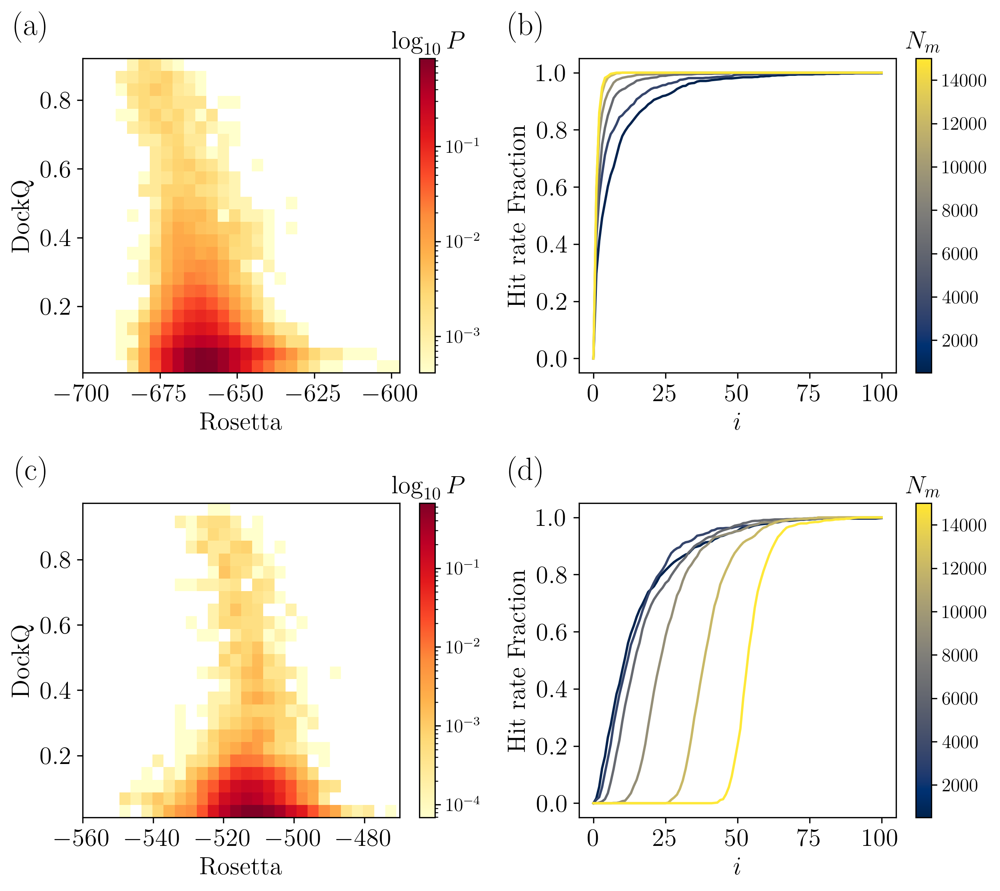

In [16]:
## Changing the hit rate plot to try and make it a PDF density plot with an inset of the supersampled data
import matplotlib
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

font_size = 16

fig, ax = plt.subplots(2,2, figsize = (9,8), dpi = 300)

cmap = matplotlib.cm.get_cmap("cividis")
color_vals = np.linspace(0,1,len(sample_list))
colors = [cmap(color_vals[i]) for i in range(len(sample_list))]

top_ranks = 100
x_axis = range(0, top_ranks + 1)

score_1 = "Rosetta"

### Exhaustively sampled data
temp_3rcz_df = exhaustive_3rcz_df[exhaustive_3rcz_df[score_1] < -590]
hh = ax[0,0].hist2d(temp_3rcz_df[score_1], temp_3rcz_df["DockQ"], norm = mcolors.LogNorm(), density = True,
                    bins = 25, cmap = "YlOrRd")

cbar_00 = plt.colorbar(hh[3], ax=ax[1,0])
cbar_00.ax.set_title("$\log_{10}P$", fontsize = font_size)

ax[0,0].set_xlabel("Rosetta", fontsize = font_size) 
ax[0,0].set_ylabel("DockQ", fontsize = font_size)

ax[0,0].set_xticks([-700, -675, -650, -625, -600])


## Panel B

for i, sample in enumerate(sampled_hit_data_3rcz):
    ax[0,1].plot(x_axis,[0] + list(sample), color = colors[i], label = str(sample_list[i]))

    
ax[0,1].set_xlabel("$i$", fontsize = font_size) 
ax[0,1].set_ylabel("Hit rate Fraction", fontsize = font_size)

ax[0,1].set_xticks([0, 25, 50, 75, 100])

## Panel C

### Exhaustively sampled data
hh = ax[1,0].hist2d(exhaustive_3ygs_df[score_1], exhaustive_3ygs_df["DockQ"], norm = mcolors.LogNorm(), bins = 25, 
                    density = True, cmap = "YlOrRd")

cbar_10 = plt.colorbar(hh[3], ax=ax[0,0])
cbar_10.ax.set_title("$\log_{10}P$", fontsize = font_size)

ax[1,0].set_xticks([-560, -540, -520, -500, -480])
ax[1,0].set_xlim([-560, -470])

ax[1,0].set_xlabel("Rosetta", fontsize = font_size) 
ax[1,0].set_ylabel("DockQ", fontsize = font_size)


## Panel D

for i, sample in enumerate(sampled_hit_data_3ygs):
    ax[1,1].plot(x_axis,[0] + list(sample), color = colors[i], label = str(sample_list[i]))

    
ax[1,1].set_xlabel("$i$", fontsize = font_size) 
ax[1,1].set_ylabel("Hit rate Fraction", fontsize = font_size)

ax[1,1].set_xticks([0, 25, 50, 75, 100])

## Colorbar

cmap = matplotlib.colormaps['cividis']
norm = matplotlib.colors.Normalize(vmin=500, vmax=15000)
sm = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

cbar1 = plt.colorbar(sm, ax = ax[1,1])
cbar1.ax.set_title("$N_m$", fontsize = font_size)
cbar2 = plt.colorbar(sm, ax = ax[0,1])
cbar2.ax.set_title("$N_m$", fontsize = font_size)

## Formatting the figure

ax[0,0].tick_params(axis='both', which='major', labelsize=font_size)
ax[0,1].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1,1].tick_params(axis='both', which='major', labelsize=font_size)


ax[0,0].text(-0.1, 1.15, "(a)", transform=ax[0,0].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')
ax[0,1].text(-0.1, 1.15, "(b)", transform=ax[0,1].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')
ax[1,0].text(-0.1, 1.15, "(c)", transform=ax[1,0].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')
ax[1,1].text(-0.1, 1.15, "(d)", transform=ax[1,1].transAxes,fontsize=int(font_size*1.3), fontweight='bold', va='top', ha='right')



fig.tight_layout()
plt.savefig(join(figure_save_dir, "3rcz_3ygs_hitrate_sampling.png"))

## Figure 2

In [21]:
from scipy.stats import spearmanr

def create_random_mask(n):
    
    rng = np.random.Generator(np.random.PCG64())
    rng = np.random.default_rng()

    # generates 0 or 1 randomly
    value = rng.integers(low=0, high=2, size=n)

    choice_a = np.array([-1,1])
    mask = np.random.choice(choice_a, size = n)
    
    return value*mask

def create_distribution_with_given_fraction(score_df, var_frac):
    '''
    Randomly varies the points of the negatives while keeping the
    positives static. Terminates when the fraction of the 
    [n(neg) < min(pos)]/n(neg) goes below the
    "var_frac" parameter
    '''
    
    ## Split the score_df into positives and negatives
    
    pos_x_data = score_df[score_df["DockQ"] >= 0.23]["ZRank"]
    pos_y_data = score_df[score_df["DockQ"] >= 0.23]["DockQ"]
    neg_x_data = np.array(score_df[score_df["DockQ"] < 0.23]["ZRank"])
    neg_y_data = score_df[score_df["DockQ"] < 0.23]["DockQ"]
    
    len_negs = len(neg_x_data)
    
    
    ## Define the perturbation that can happen with each step
    eta = 0.005
    
    ## initialize the current correlation value
    frac_curr = 0
    
    safety_count = 1000000 ## Just to avoid an infinite loop
    i = 0
    pos_min = min(pos_x_data)
    while True:
        if i > safety_count:
            print("SAFETY COUNT REACHED")
            break
        ## Create random array for x
        
        if frac_curr >= var_frac:
            break
        
        rand_x = create_random_mask(len_negs) * eta
        
        ## Apply the random array to x, which determines whether the points move
        
        neg_x_data = neg_x_data + rand_x
        
        ## Calculate the variance fraction!
    
        frac_curr = len(neg_x_data[neg_x_data < pos_min])/len(neg_x_data)
        
        i+=1
        
    
    ## Recreate the DF for output purposes
    
    temp_dict = {"ZRank" : [], "DockQ" : []}
    
    temp_dict["ZRank"] += list(pos_x_data)
    temp_dict["ZRank"] += list(neg_x_data)
    temp_dict["DockQ"] += list(pos_y_data)
    temp_dict["DockQ"] += list(neg_y_data)
    
    
    print(frac_curr)
    return pd.DataFrame(temp_dict)
    

def get_cutoff_imbalanced_set(cutoff_x, df_list, imbalance_fraction = 0.5):

    unbalanced_list_95 = []

    sample_list = [500, 1000, 2000, 5000, 10000, 15000, 30000, 45000]

    score_fxn = 'ZRank' ## again, placeholder for the "score"

    hit_rate_list_95 = []

    for i in range(5):
        print(i)
        temp_unbal_list = create_unbalanced_dataset(df_list[i], imbalance_fraction, cutoff_x = cutoff_x)
        unbalanced_list_95.append(temp_unbal_list)
        hit_rate_list_95.append(sample_for_hit_rate_test_supp(temp_unbal_list, sample_list, score_col = score_fxn, dockq_cutoff = 0.23))
        
    return unbalanced_list_95, hit_rate_list_95

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff_x = -100000, cutoff_y = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    ## Apply both cutoffs to the high data
    high_df = example_df[example_df["DockQ"] >= cutoff_y]
    high_df = high_df[high_df["ZRank"]>= cutoff_x]
    
    low_df = example_df[example_df["DockQ"] < cutoff_y]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def make_hit_rate_plot_sample_supp(sample_list, column = "ZRank", top_ranks = 50, dockq_cutoff = 0.23):
    '''
    Makes a hit rate plot from the score_dict. Hit rate is calculated based
    on the column name provided and the hit rate plot is calculated up to the
    top_ranks specified
    '''
    
    hit_rate_final = np.zeros((len(sample_list),top_ranks)) ## Create the hit rate plot y_axis
    hit_rate_x = range(1,top_ranks + 1)
    
    for i,temp_df in enumerate(sample_list):
        score_vals = np.array(temp_df[column]) ## gets the score column for each PDB
        dockq_vals = np.array(temp_df["DockQ"]) ## gets all of the CAPRI scores for the minimum
        
        ## Sorting the dataframes
        sort_vals = np.argsort(score_vals)
#         sort_vals = np.flip(sort_vals)
        score_vals = score_vals[sort_vals]
        dockq_vals = dockq_vals[sort_vals]
        
        hit_bool = False ## controls whether you found a positive
        for j in range(top_ranks):
            if dockq_vals[j] >= dockq_cutoff:
                ## Positive has been found in the top_ranks
                hit_bool = True
            if hit_bool:
                hit_rate_final[i,j] = 1
            else:
                hit_rate_final[i,j] = 0
                
    return np.mean(hit_rate_final, axis = 0), hit_rate_x


def sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = 100, score_col = "ZRank", dockq_cutoff = 0.23):
    '''
    Make a hit rate plot for each sample size in the sample
    list. Return a list of hit rate plot lists in the top_ranks. 
    '''
    
    ## init list to save hit rate data
    
    all_hit_rate_plots = []
    
    for n_samples in sample_list:
                
        temp_sample_list = []
        
        for i in range(1000):
            
            ## Get the random sample of the dataframe - no replacement
        
            temp_random_df = score_df.sample(n = n_samples, replace = False)
            
            temp_sample_list.append(temp_random_df)
            
        ## Get the hit rate and append to the list
        
        hit_rate_data, x_ax_vals = make_hit_rate_plot_sample_supp(temp_sample_list, column = score_col,
                                                             top_ranks = top_ranks, dockq_cutoff = dockq_cutoff)
        all_hit_rate_plots.append(hit_rate_data)
        
    return all_hit_rate_plots
    
    
## Function to do the hit rate plot that Alex and Corey want me to do

def hit_rate_all_targets_sampling(score_dict, sample_list, highest_rank = 100, score_col = "ZRank", dockq_cutoff = 0.23):
    '''
    Performs sampling of the score dict according to the sample list and then 
    finds the hit rate using the highest_rank and the score_col. The 
    DockQ cutoff can be changed as well to change what is defined as a 'hit' or not
    '''
    
    final_pdb_list = []
    final_hr_list = []
    
    ## got through all the PDBs and perform sampling on the exhaustive dataset
    for pdb_name, score_df in score_dict.items():
        
#         try:
#             test_hr = sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = highest_rank, 
#                                                     score_col = score_col, dockq_cutoff = dockq_cutoff)

#             final_pdb_list.append(pdb_name)

#             ## Save only the last element of the list for each sample test
#             test_arr = np.array(test_hr)
#             final_hr_list.append(test_arr.T[-1,:])
            
#         except:
#             print("FAILED ON PDB:", pdb_name)
                
    
        test_hr = sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = highest_rank, 
                                                    score_col = score_col, dockq_cutoff = dockq_cutoff)

        final_pdb_list.append(pdb_name)

        ## Save only the last element of the list for each sample test
        test_arr = np.array(test_hr)
        final_hr_list.append(test_arr.T[-1,:])
    ## Quickly make a dictionary of the data
    
    temp_dict = {"pdb": final_pdb_list, "final_hr": final_hr_list}
    
    return temp_dict

## Code to get the AUC with balancing extreme to work

def get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1):
    '''
    Simply aggregates all the score and label data across all targets in a dataframe and 
    then turns them into ROC curve data
    '''
    
    temp_mask, temp_scores = create_ROC_data_struc_dockq(score_df, col_name = col_name, dockq_cutoff = dockq_cutoff)
    roc_curve = metrics.roc_curve(temp_mask, factor*np.array(temp_scores), pos_label=1)
    roc_auc = metrics.roc_auc_score(temp_mask, factor*np.array(temp_scores))
    
    return roc_curve, roc_auc

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    high_df = example_df[example_df["DockQ"] >= cutoff]
    low_df = example_df[example_df["DockQ"] < cutoff]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    print(len(high_df), high_num)
        
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def create_unbalanced_dataset_negs(example_df, imbalance_fraction, cutoff = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want above the cutoff
    '''
    
    high_df = example_df[example_df["DockQ"] >= cutoff]
    low_df = example_df[example_df["DockQ"] < cutoff]

    
    total_num = round(len(high_df)/(1-imbalance_fraction))
    low_num = total_num - len(high_df)
    
    print(len(low_df), low_num)
        
    low_df_sample = low_df.sample(n = low_num, replace = False)

    combined_df = pd.concat([high_df, low_df_sample])
    
    return combined_df

def conduct_unbalancing_test_targets(score_df, frac_list):
    '''
    Conduct the unbalancing test to test
    AUC to the extreme
    '''
    
    roc_curve_list = []
    roc_auc_list = []
    
    for fraction in frac_list:
        
        temp_df = create_unbalanced_dataset_negs(score_df, fraction)
        
        roc_curve, roc_auc = get_indiv_ROC_curve(temp_df, col_name = "ZRank")
        
        roc_curve_list.append(roc_curve)
        roc_auc_list.append(roc_auc)
        
        
    return roc_curve_list, roc_auc_list

def conduct_unbalancing_test(score_df, frac_list):
    '''
    Conduct the unbalancing test to test
    AUC to the extreme
    '''
    
    roc_curve_list = []
    roc_auc_list = []
    
    for fraction in frac_list:
        
        temp_df = create_unbalanced_dataset(score_df, fraction)
        
        roc_curve, roc_auc = get_indiv_ROC_curve(temp_df, col_name = "ZRank")
        
        roc_curve_list.append(roc_curve)
        roc_auc_list.append(roc_auc)
        
        
    return roc_curve_list, roc_auc_list
        
def create_ROC_data_struc_dockq(score_df, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Takes the score_df (DataFrame) and a given 'col_name' which corresponds to one of the columns 
    in the dataframe and some quality metric, which is what treats the data as a true positive. 
    True positives are labeled with a 1 and false positives are labeled with a 0.
    '''
    
    temp_scores = score_df[col_name]
    temp_dockq = score_df["DockQ"]
    
    ## Get the label array for the capri scores
    score_mask = np.zeros(temp_dockq.size)
    temp_dockq = list(temp_dockq)
    for i in range(len(score_mask)):
#         print(temp_dockq[i])
        if temp_dockq[i] >= dockq_cutoff:
            score_mask[i] = 1
    
    return score_mask, temp_scores


In [19]:
## Running

sample_list = list(range(500,10000,500))


highest_rank = 100
score_col = "ZRank"
dockq_cutoff = 0.23
all_sampling_hr_dict = hit_rate_all_targets_sampling(exhaustive_score_dict, sample_list, highest_rank=highest_rank, 
                                         score_col = score_col, dockq_cutoff=dockq_cutoff)

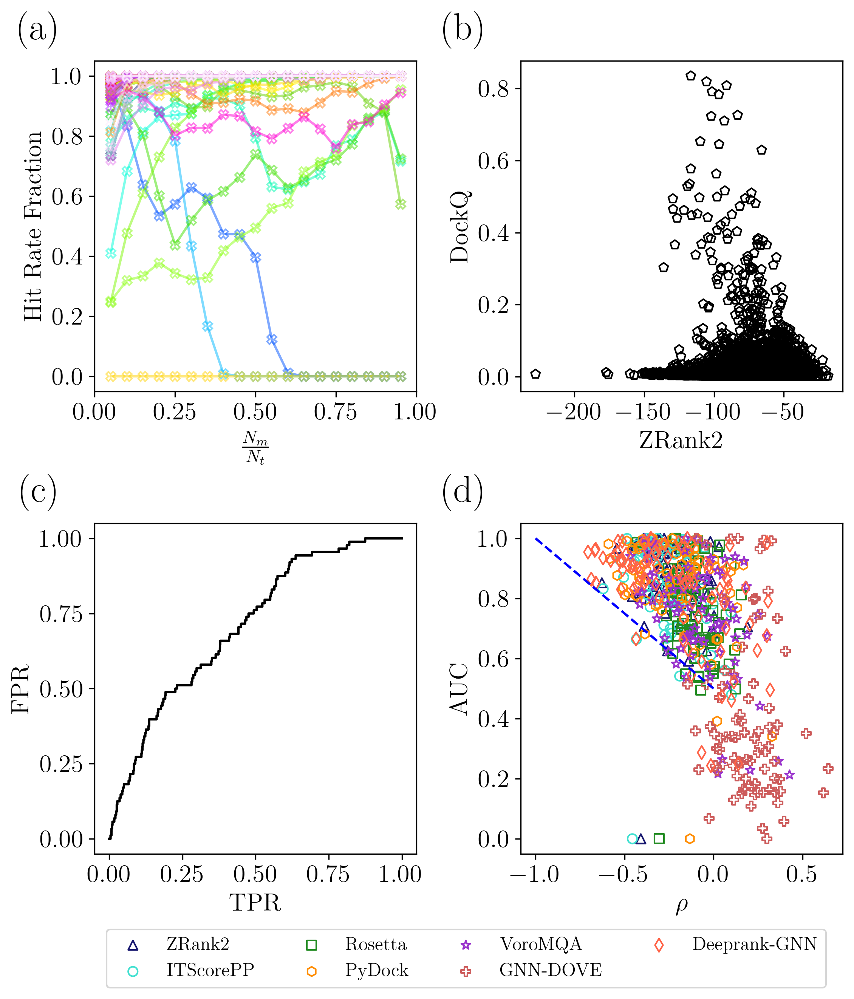

In [22]:
fig, ax = plt.subplots(2,2, figsize=(8,8.5), dpi = 300)

#### Panel A ####

import matplotlib

fontsize = 16

cmap = matplotlib.cm.get_cmap('gist_ncar')

colormap_colors = cmap(list(np.linspace(0,1,84)))

for i,line_data in enumerate(all_sampling_hr_dict["final_hr"]):
    ax[0,0].plot(np.array(sample_list)/10000, line_data, marker = "X", markerfacecolor = "None",
            alpha = 0.5, color = colormap_colors[i])


ax[0,0].set_xlabel(r"$\frac{N_{m}}{N_{t}}$", fontsize = fontsize)
ax[0,0].set_ylabel("Hit Rate Fraction", fontsize = fontsize)

ax[0,0].set_xticks([0,0.25, 0.5, 0.75, 1.0])


#### Panel B ####

temp_target = "3u82"
score_df = exhaustive_score_dict[temp_target]

temp_score = "ZRank"
ax[0,1].scatter(score_df[temp_score], score_df["DockQ"], marker = "p", color = "black", facecolor = "None")

# ax[0,1].plot(np.unique(score_df[temp_score]), np.poly1d(np.polyfit(score_df[temp_score], score_df["DockQ"], 1))(np.unique(score_df[temp_score])),
#             color = "red", linestyle = "--")

ax[0,1].set_xlabel("ZRank2", fontsize = fontsize)
ax[0,1].set_ylabel("DockQ", fontsize = fontsize)

ax[0,1].set_xticks([-200, -150, -100, -50])

# print("Pearson correlation for Panel B:", pearsonr(score_df[temp_score], score_df["DockQ"])[0])

#### Panel C ####

roc_curve, roc_auc = get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1)

ax[1,0].plot(roc_curve[0], roc_curve[1], color = "black")

ax[1,0].set_xlabel("TPR", fontsize = fontsize)
ax[1,0].set_ylabel("FPR", fontsize = fontsize)

ax[1,0].set_xticks([0,0.25, 0.5, 0.75, 1.0])
ax[1,0].set_yticks([0,0.25, 0.5, 0.75, 1.0])

#### Panel D ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_zrank"], exhaustive_corr_df["zrank_auc"], color = colors[0], marker = "^", facecolor = "None", label = "ZRank2")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_itscorepp"], exhaustive_corr_df["itscorepp_auc"], color = colors[1], marker = "o", facecolor = "None", label = "ITScorePP")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_rosetta"], exhaustive_corr_df["rosetta_auc"], color = colors[2], marker = "s", facecolor = "None", label = "Rosetta")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_pydock"], exhaustive_corr_df["pydock_auc"], color = colors[3], marker = "h", facecolor = "None", label = "PyDock")
ax[1,1].scatter(np.array(exhaustive_corr_df["spearman_dockq_voromqa"])*-1, exhaustive_corr_df["voromqa_auc"], color = colors[4], marker = "*", facecolor = "None", label = "VoroMQA")
ax[1,1].scatter(exhaustive_corr_df["spearman_dockq_dove_5"], exhaustive_corr_df["dove_5_auc"], color = colors[5], marker = "P", facecolor = "None", label = "GNN-DOVE")
ax[1,1].scatter(np.array(exhaustive_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1, exhaustive_corr_df["deeprank_gnn_esm_auc"], color = colors[6], marker = "d", facecolor = "None", label = "Deeprank-GNN")

## Y = -X

temp_x = np.linspace(-1, 0, 10)
temp_y = np.linspace(0.5, 1, 10)[::-1]
ax[1,1].plot(temp_x, temp_y, "b--", )

ax[1,1].set_xlabel(r"$\rho$", fontsize = font_size)
ax[1,1].set_ylabel("AUC", fontsize = font_size)

ax[1,1].set_xticks([-1, -0.5,0, 0.5])

ax[1,1].legend(loc = "upper center", bbox_to_anchor = (-0.17, -0.2), ncol = 4)


# ax[1].legend(handles = [l1,l2,l3] , labels=['A', 'B', 'C'],loc='upper center', 
#              bbox_to_anchor=(0.5, -0.2),fancybox=False, shadow=False, ncol=3)

#### FORMATTING ####

letters = [['a', 'b'], ['c', 'd']]
for i in range(2):
    for j in range(2):
        ax[i,j].tick_params(axis='both', which='major', labelsize=font_size)
        ax[i,j].text(-0.1, 1.15, f"({letters[i][j]})", transform=ax[i,j].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


# fig.tight_layout()

#### Positioning ####

ax[0,0].set_position([0.06,0.53,0.355,0.343])
ax[0,1].set_position([0.53,0.53,0.355,0.343])

ax[1,0].set_position([0.06,0.05,0.355,0.343])
ax[1,1].set_position([0.53,0.05,0.355,0.343])

plt.savefig(join(figure_save_dir, "Exhasutive_sampling_hit_scoring_and_hitrate_issues.png"))


## Figure 3

In [24]:
## Creates the probability distribution without plotting it

def create_prob_dist_identical_bins_dockq(data, fig, ax, bins = [], n_bins = 100, color = "black", label = None, alpha = 1.0, marker = "o"):
    '''
    plots a probability distribution from the data provided
    '''
    if bins == []:
        bins = np.linspace(min(data),max(data),n_bins)
        bin_range = abs(bins[1]-bins[0])
        bins = np.array([min(bins)-bin_range] + list(bins) + [max(bins) + bin_range])
    
    n, bins, patches = ax.hist(data, bins=bins, density=True, histtype= "step", alpha = 0)
    bins = np.delete(bins, -1)
    bins += abs(bins[1]-bins[0])/2
    
    
#     ax.plot(bins, n, marker=marker, color=color, markerfacecolor='none', label = label, alpha = alpha)
    
    x = np.array(bins)
    y = np.array(n)
    
    return x, y

/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_36036/408420658.py:7: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if bins == []:


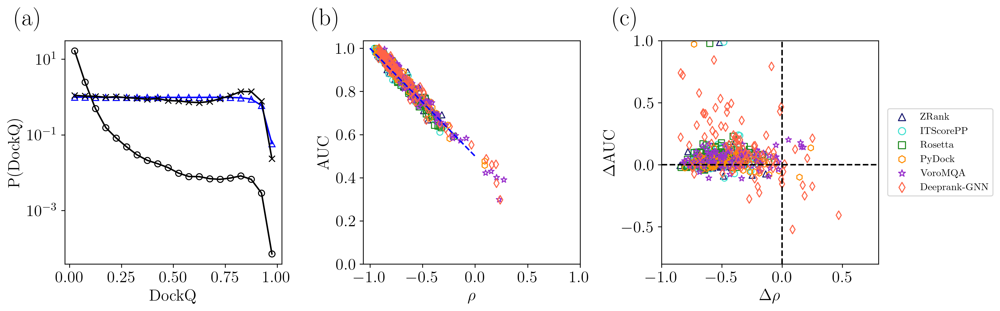

In [25]:
## Tenative Figure 1 - A
%matplotlib inline

font_size = 16

fig, ax = plt.subplots(1,3, figsize = (14,4.5), dpi = 300)

#### Panel A ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

x_axis = np.linspace(0.025, 0.975, 20)

before_dockq_mean = np.array(before_dockq_mean)
before_dockq_mean_mod = before_dockq_mean/50

after_dockq_mean = np.array(after_dockq_mean)
after_dockq_mean_mod = after_dockq_mean/50

ax[0].plot(x_axis, before_dockq_mean_mod, label = "Supersampled before minimization", color = "blue", marker = "^", markerfacecolor = "None")
ax[0].plot(x_axis, after_dockq_mean_mod, label = "Supersampled after minimization", color = "black", marker = "x")

## Averaged DockQ for Exhaustive Data

nbins = 21
bins = np.linspace(0, 1, nbins)

dockq_arr = np.zeros((len(exhaustive_score_dict), nbins-1))

for i,pdb_name in enumerate(list(exhaustive_score_dict.keys())):

    temp_x, temp_y = create_prob_dist_identical_bins_dockq(exhaustive_score_dict[pdb_name]["DockQ"], fig, ax[2], bins = bins, color = "black", label = None, alpha = 1.0, marker = "o")
    dockq_arr[i,:] = temp_y
    
# ax[2].plot(temp_x, temp_y, color = "slateblue", marker = "o", markerfacecolor = "None", linewidth = 0.8, alpha = 0.1, label = "Individual Targets")
    
avg_dockq = np.mean(dockq_arr, axis = 0)

ax[0].plot(temp_x, avg_dockq, color = "black", marker = "o", markerfacecolor = "None", label = "Averaged")

ax[0].set_yscale("log")

ax[0].set_xlabel("DockQ", fontsize = font_size)
ax[0].set_ylabel("P(DockQ)", fontsize = font_size)

## Change x_ticks

ax[0].set_xticks([0, 0.25, 0.5, 0.75, 1.0])

#### Panel B ####

ax[1].scatter(ss_corr_df["spearman_dockq_zrank"], ss_corr_df["zrank_auc"], color = colors[0], marker = "^", facecolor = "None", label = "ZRank2")
ax[1].scatter(ss_corr_df["spearman_dockq_itscorepp"], ss_corr_df["itscorepp_auc"], color = colors[1], marker = "o", facecolor = "None", label = "ITScorePP")
ax[1].scatter(ss_corr_df["spearman_dockq_rosetta"], ss_corr_df["rosetta_auc"], color = colors[2], marker = "s", facecolor = "None", label = "Rosetta")
ax[1].scatter(ss_corr_df["spearman_dockq_pydock"], ss_corr_df["pydock_auc"], color = colors[3], marker = "h", facecolor = "None", label = "PyDock")
ax[1].scatter(np.array(ss_corr_df["spearman_dockq_voromqa"])*-1, ss_corr_df["voromqa_auc"], color = colors[4], marker = "*", facecolor = "None", label = "VoroMQA")
# ax1_7 = ax[1].scatter(temp_ss_corr_df["spearman_dockq_dove_5"], temp_ss_corr_df["dove_5_auc"], color = colors[5], marker = "P", facecolor = "None", label = "GNN-DOVE")
ax[1].scatter(np.array(ss_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1, ss_corr_df["deeprank_gnn_esm_auc"], color = colors[6], marker = "d", facecolor = "None", label = "Deeprank-GNN")


## Y = -X

temp_x = np.linspace(-1, 0, 10)
temp_y = np.linspace(0.5, 1, 10)[::-1]
ax[1].plot(temp_x, temp_y, "b--", )

ax[1].set_xlabel(r"$\rho$", fontsize = font_size)
ax[1].set_ylabel("AUC", fontsize = font_size)


y_ticks_temp = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
x_ticks_temp = [-1.0, -0.5,  0.0,  0.5, 1.0]
ax[1].set_xticks(x_ticks_temp)
ax[1].set_yticks(y_ticks_temp)

#### Panel C ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "tomato"]

zrank_spearman_delta = np.abs(np.array(ss_corr_df["spearman_dockq_zrank"]))*-1 - np.abs(np.array(exhaustive_corr_df["spearman_dockq_zrank"]))*-1
zrank_auc_delta = np.array(ss_corr_df["zrank_auc"]) - np.array(exhaustive_corr_df["zrank_auc"])

hdock_spearman_delta = np.abs(np.array(ss_corr_df["spearman_dockq_itscorepp"]))*-1 - np.abs(np.array(exhaustive_corr_df["spearman_dockq_itscorepp"]))*-1
hdock_auc_delta = np.array(ss_corr_df["itscorepp_auc"]) - np.array(exhaustive_corr_df["itscorepp_auc"])

rosetta_spearman_delta = np.abs(np.array(ss_corr_df["spearman_dockq_rosetta"]))*-1 - np.abs(np.array(exhaustive_corr_df["spearman_dockq_rosetta"]))*-1
rosetta_auc_delta = np.array(ss_corr_df["rosetta_auc"]) - np.array(exhaustive_corr_df["rosetta_auc"])

pydock_spearman_delta = np.abs(np.array(ss_corr_df["spearman_dockq_pydock"]))*-1 - np.abs(np.array(exhaustive_corr_df["spearman_dockq_pydock"]))*-1
pydock_auc_delta = np.array(ss_corr_df["pydock_auc"]) - np.array(exhaustive_corr_df["pydock_auc"])

voromqa_spearman_delta = np.abs(np.array(ss_corr_df["spearman_dockq_voromqa"])) *-1 - np.abs(np.array(exhaustive_corr_df["spearman_dockq_voromqa"])) *-1
voromqa_auc_delta = np.array(ss_corr_df["voromqa_auc"]) - np.array(exhaustive_corr_df["voromqa_auc"])

deeprank_spearman_delta = np.abs(np.array(ss_corr_df["spearman_dockq_deeprank_gnn_esm"])) *-1 - np.abs(np.array(relaxed_corr_df["spearman_dockq_deeprank_gnn_esm"])) *-1
deeprank_auc_delta = np.array(ss_corr_df["deeprank_gnn_esm_auc"]) - np.array(relaxed_corr_df["deeprank_gnn_esm_auc"])

ax2_1 = ax[2].scatter(zrank_spearman_delta,
           zrank_auc_delta,
           color = colors[0], marker = "^", label = "ZRank", facecolor = "None")
ax2_2 = ax[2].scatter(hdock_spearman_delta,
           hdock_auc_delta,
           color = colors[1], marker = "o", label = "ITScorePP", facecolor = "None")
ax2_3 = ax[2].scatter(rosetta_spearman_delta,
           rosetta_auc_delta,
           color = colors[2], marker = "s", label = "Rosetta", facecolor = "None")
ax2_4 = ax[2].scatter(pydock_spearman_delta,
           pydock_auc_delta,
           color = colors[3], marker = "h", label = "PyDock", facecolor = "None")
ax2_5 = ax[2].scatter(voromqa_spearman_delta,
           voromqa_auc_delta,
           color = colors[4], marker = "*", label = "VoroMQA", facecolor = "None")
ax2_6 = ax[2].scatter(deeprank_spearman_delta,
           deeprank_auc_delta,
           color = colors[5], marker = "d", label = "Deeprank-GNN", facecolor = "None")

ax[2].set_ylabel("$\Delta$AUC", fontsize = 16)
ax[2].set_xlabel(r"$\Delta\rho$", fontsize = 16)

## Create vertical and horizontal dotted lines

x_vert = [0,0]
y_vert = [-0.8, 1.0]rebu
ax[2].plot(x_vert, y_vert, color = "black", linestyle = "--")

x_horiz = [-1, 0.8]
y_horiz = [0,0]
ax[2].plot(x_horiz, y_horiz, color = "black", linestyle = "--")

ax[2].set_xlim([-1, 0.8])
ax[2].set_ylim([-0.8, 1.0])


###### LEGEND #######
lgnd = ax[2].legend(handles = [ax2_1, ax2_2, ax2_3, ax2_4, ax2_5, ax2_6],
        loc='center right', bbox_to_anchor=(1.55, 0.5), ncol=1, fontsize = font_size-6)
# lgnd = ax[1].legend(loc='upper right',
#           ncol=2, fontsize = font_size-8)

for k in range(6):
    lgnd.legendHandles[k]._sizes = [50]
    
### FORMATTING

letters = ['a', 'b', 'c']
for i in range(3):
    ax[i].tick_params(axis='both', which='major', labelsize=font_size)
    ax[i].text(-0.1, 1.15, f"({letters[i]})", transform=ax[i].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


plt.tight_layout()
plt.savefig(join(figure_save_dir, "supersampling_improvement_update_exhaustive.png"))

## Figure 4

['3whq', '1ugq', '1n1j', '4uzz', '1kfu', '4g6t', '5k7m', '1c3a', '5by8', '1r8o', '4ct6', '4qjf', '1vet', '3vz9', '5maw', '3dgp', '1pdk', '1f60', '2wmp', '4je3', '1ugh', '2bkr', '8enf', '2oul', '2fhz', '1spp', '5dmb', '5mu7', '3wdg', '4h5s', '2hla', '1ry7', '5uq2', '3gfk', '6zbk', '4gi3', '7joe', '3qc8', '4yii', '4dbg', '7bxh', '1acb', '4u1c', '1euv', '1ay7', '1ggp', '3rcz', '4bi8', '1tfo', '6yxj', '1qav', '1wqj', '2pe6', '2g2u', '4k12', '5zrz', '1j7d', '1wrd', '7jxv', '6xod', '4dhi', '6kp3', '1xg2', '4qlp', '3sgb', '4hwi', '2hth', '1itb', '6wg4', '3k9p', '3fpn', '2dvw', '3qhy', '3u82', '6fud', '3hw2', '1wmh', '2hsm', '3ona', '3ygs', '2h7z', '2grn', '2d5r', '1mbv']


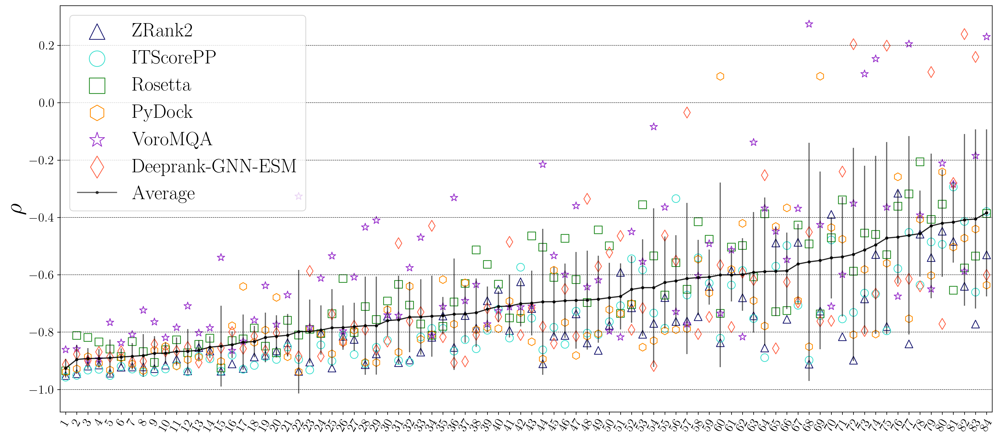

In [26]:
## Only scores that do well now

num_samples = len(ss_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]



score_ref = ["spearman_dockq_zrank", "spearman_dockq_itscorepp", "spearman_dockq_rosetta",
             "spearman_dockq_pydock", "spearman_dockq_voromqa","spearman_dockq_deeprank_gnn_esm"]
spearman_data = np.zeros((len(score_ref),num_samples))

for i in range(len(score_ref)):
    for j in range(num_samples):
        if "deeprank" in score_ref[i] or "voromqa" in score_ref[i]:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j] * -1
        else:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j]

fig, ax = plt.subplots(figsize = (18,8), dpi = 300)

mean_data = np.mean(spearman_data, axis = 0)

stdev_data = np.std(spearman_data, axis = 0)

sorted_data = spearman_data[:, mean_data.argsort()]

sorted_mean_data = mean_data[mean_data.argsort()]

sorted_stdev_data = stdev_data[mean_data.argsort()]


pdb_order = list(np.array(ss_corr_df["pdb"])[mean_data.argsort()])
print(pdb_order)
label_ticks = list(range(1, len(ss_corr_df)+1))
x = np.linspace(0.5, num_samples-0.5, num_samples)
plt.xticks(x, label_ticks)
plt.xticks(rotation = 60, fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlim(0, num_samples)

marker_size = 100

ax.scatter(x, sorted_data[0], color = colors[0], marker = "^", label = "ZRank2", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[1], color = colors[1], marker = "o", label = "ITScorePP", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[2], color = colors[2], marker = "s", label = "Rosetta", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[3], color = colors[3], marker = "h", label = "PyDock", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[4], color = colors[4], marker = "*", label = "VoroMQA", facecolor = "None", s = marker_size)
ax.scatter(x, sorted_data[5], color = colors[6], marker = "d", label = "Deeprank-GNN-ESM", facecolor = "None", s = marker_size)

plt.errorbar(x, sorted_mean_data, yerr = sorted_stdev_data, color = "black", marker = ".", alpha = 0.6)

ax.plot(x, sorted_mean_data, color = "black", marker = ".", label = "Average", alpha = 0.6)

ax.set_ylabel(r"$\rho$", fontsize = 30)

fig.tight_layout()
lgnd = plt.legend(fontsize = 25)
lgnd.legendHandles[0]._sizes = [400]
lgnd.legendHandles[1]._sizes = [400]
lgnd.legendHandles[2]._sizes = [400]
lgnd.legendHandles[3]._sizes = [400]
lgnd.legendHandles[4]._sizes = [400]
lgnd.legendHandles[5]._sizes = [400]
plt.grid(axis = "y", color = 'black', linestyle = '--', linewidth = 0.5)
plt.savefig(join(figure_save_dir, "per_target_spearman_no_dove.png"))

## Figure 5

In [35]:
## Center of mass for each chain function

def get_com_for_particle(coords):
    '''
    Calculates the center of mass for the coordinates
    provided to the function
    '''
    com = np.mean(coords, axis = 0)
    return com

def get_heterodimer_coords(model_structure):
    '''
    Gets the coordinates for the receptor and ligand
    from the provided model_structure
    '''
    
    rec_coords = []
    lig_coords = []

    chain_num = 0

    for chain in model_structure:

        if chain_num < 2:

            for residue in chain:

                if chain_num == 0:
                    rec_coords.append(list(residue["CA"].get_coord()))

                if chain_num == 1:
                    lig_coords.append(list(residue["CA"].get_coord()))

            chain_num += 1


    ## Get the center of mass for the receptor

    rec_coords = np.array(rec_coords)
    lig_coords = np.array(lig_coords)
    
    return rec_coords, lig_coords

def get_com_for_both_monomers(pdb_list, target_path, include_target = False):
    '''
    Gets the center of mass for both monomers in the 
    dimers fed into the program with the PBD list
    '''
    
    aligner = Bio.PDB.Superimposer()
    parser = Bio.PDB.PDBParser()
    
    ## Create the list to store the centers of mass
    
    com_list = []
    sigma_list = []
    model_name_list = []
    lig_list = []
    
    ## Align all the structures to the target 
    
    target_model, aligned_models = align_pdb_list_to_target(target_path, pdb_list, start = 1, end = 50)
    
    ## Get the COMs for the target_model
    
    if include_target:
        rec_coords, lig_coords = get_heterodimer_coords(target_model)
        rec_com = get_com_for_particle(rec_coords)
        rec_coords_norm = rec_coords - rec_com
        lig_coords_norm = lig_coords - rec_com

        lig_com = get_com_for_particle(lig_coords_norm)

        com_list.append(lig_com)

        sigma_rl = np.sqrt(np.sum(lig_com ** 2))

        sigma_list.append(sigma_rl)

        model_name_list.append("target")
        
        lig_list.append(lig_coords[0])
    
    ## Loop through the structures
    
    first_bool = True
    first_struct = []
    
    for i,pdb_model in enumerate(aligned_models):
                
        model_name_list.append(pdb_list[i].split("_corrected_H")[0])
            
        ## Get the coordinates for the receptor and the ligand chains
        
        rec_coords, lig_coords = get_heterodimer_coords(pdb_model)
        
        rec_com = get_com_for_particle(rec_coords)
        
        ## Normalize all the coordinates based on the receptor center of mass, so that the receptor COM is origin
        
        rec_coords_norm = rec_coords - rec_com
        lig_coords_norm = lig_coords - rec_com
    
        ## Get the center of mass for the ligand
        
        lig_com = get_com_for_particle(lig_coords_norm)
        
        com_list.append(lig_com)
            
        ## Get the displacement of the center of mass of ligand from the center of the receptor
        
        sigma_rl = np.sqrt(np.sum(lig_com ** 2))
        
        sigma_list.append(sigma_rl)
        
        ## Add the orientation vector for each model
        
        lig_list.append(lig_coords[0])
    
    ## Normalize the distance of the center of mass of the ligand so that it matches the <sigma_ij> for all models
    
#     print("Lig list", len(lig_list))
#     print("COM list", len(com_list))
#     print("model list", len(model_name_list))
#     print("sigma list", len(sigma_list))
    
    ## Create a dictionary from the data
    
    tmp_x = [coord[0] for coord in com_list]
    tmp_y = [coord[1] for coord in com_list]
    tmp_z = [coord[2] for coord in com_list]
    
    ## Get Coordinates for a ligand orientation vector, which is the first CA for the ligand
    
    lig_x = [coord[0] for coord in lig_list]
    lig_y = [coord[1] for coord in lig_list]
    lig_z = [coord[2] for coord in lig_list]
    
    ## Add data to the dictionary
    
    tmp_dict = {
        "Decoy" : model_name_list,
        "sigma" : sigma_list,
        "com_x" : tmp_x,
        "com_y" : tmp_y,
        "com_z" : tmp_z,
        "lig_x" : lig_x,
        "lig_y" : lig_y,
        "lig_z" : lig_z,
    }
    
    return pd.DataFrame(tmp_dict)


## Create a function that aligns structures

def align_pdb_list_to_target(target_path, pdb_list, start = 1, end = 50):
    '''
    Aligns all the pdbs in the pdb_list to the 
    pdb in the target path, which is a full path to
    the specific target. Only the coordinates of
    the C-alpha atoms are aligned. Start and end
    are the residues IDs that you are aligning 
    for each 
    '''
    
    ## Create the list of the PDB residue IDs that we are going to align
    
    residue_ids_to_align = range(start, end + 1)
    
    ## Do the PDB parser thing
    
    pdb_parser = Bio.PDB.PDBParser(QUIET = True)
    
    ## Init the superimposer
    
    superimposer = Bio.PDB.Superimposer()

    ## Get the target structure 
    
    target_structure = pdb_parser.get_structure("target", target_path)
    target_model = target_structure[0]
    
    target_ca = []
    
    first_chain_bool = True
    
    for chain in target_model:
        if first_chain_bool:
            
            for residue in chain:
                if residue.get_id()[1] in residue_ids_to_align:
                    target_ca.append(residue['CA'])
                
            first_chain_bool = False
        break
    
    transformed_model_list = []
    
    for pdb_model in pdb_list:
        
        temp_ca = []
        
        temp_structure = pdb_parser.get_structure("model", pdb_model)
        temp_model = temp_structure[0]
        
        for chain in temp_model:
            for residue in chain:
                if residue.get_id()[1] in residue_ids_to_align:
                    temp_ca.append(residue['CA'])
            
            break ## break after the first chain
            
        
        ## Superimpose the model to the target
        
        superimposer.set_atoms(target_ca, temp_ca)
        superimposer.apply(temp_model.get_atoms())
        
        ## Add the transformed model to the list
        
        transformed_model_list.append(temp_model)
        
        
    return target_model, transformed_model_list


def normalize_point_distance(com_df, extra_scalar = 1):
    '''
    Takes in the COM dataframe and outputs
    another dataframe that has all of the 
    COM vectors of the receptor normalized
    so they are all equidistant from the origin
    based on their average distance from the origin
    at the beginning. 
    '''
    
    mean_distance = np.mean(com_df["sigma"])
    
    scalars = mean_distance/np.array(com_df["sigma"]) * extra_scalar
    
    new_x = np.array(com_df["com_x"]) * scalars
    
    new_y = np.array(com_df["com_y"]) * scalars
    
    new_z = np.array(com_df["com_z"]) * scalars
    
    new_dict = {
        "Decoy" : com_df["Decoy"],
        "com_x" : new_x,
        "com_y" : new_y,
        "com_z" : new_z
    }
    
    return pd.DataFrame(new_dict)
    
    

In [36]:
## Moment of inertia calculations and relative anisotropy

In [41]:
## Moment of intertia tensor functions

def normalize_point_cloud(points, score_vals):
    '''
    Calculates the center of mass of the points
    weighted by the dockq_vals and then normalizes
    the points in the cloud by that center of mass.
    points is nx3, score_vals is nx1
    '''
    
    ## Get the center of "mass" of the points
    
    points = points.T
    
    com_x = np.sum(points[0,:] * score_vals)/np.sum(score_vals)
    com_y = np.sum(points[1,:] * score_vals)/np.sum(score_vals)
    com_z = np.sum(points[2,:] * score_vals)/np.sum(score_vals)
    
    ## Normalize all the points according to the center of "mass"
    
    points[0,:] -= com_x 
    points[1,:] -= com_y 
    points[2,:] -= com_z 
    
#     print(com_x, com_y, com_z)
    
    return points.T

## Calculate the moment of inertia tensor for the point cloud

def calculate_moment_of_inertia_tensor(points, score_vals):
    '''
    Calculates the Moment of inertia tensor for the points
    weighted by the score_vals that are provided to it.
    Moment of inertia tensor is symmetric.
    Points are all normalized according to the center of "mass"
    '''
    
    ## Put score_vals through min/max normalization
    
    score_vals_norm = (score_vals - score_vals.min()) / (score_vals.max() - score_vals.min())
    
    ## Normalize the points
    
#     print(points[:3, :])
    
    points = normalize_point_cloud(points, score_vals_norm)
    
    print(points[:3, :])
    
    ## Get the terms of the moment of inertia tensor
    
    points = points.T
    
    x = points[0,:]
    y = points[1,:]
    z = points[2,:]
    
    i_xx = np.sum(score_vals_norm * (y**2 + z**2))
    i_yy = np.sum(score_vals_norm * (x**2 + z**2))
    i_zz = np.sum(score_vals_norm * (x**2 + y**2))
    
    i_xy = -np.sum(score_vals_norm * x * y)
    i_xz = -np.sum(score_vals_norm * x * z)
    i_yz = -np.sum(score_vals_norm * y * z)
    
    ## Put the terms into a tensor
    
    final_tensor = [
        [i_xx, i_xy, i_xz],
        [i_xy, i_yy, i_yz],
        [i_xz, i_yz, i_zz]
    ]
    
#     print(final_tensor)

    return np.array(final_tensor)

## Volume of the moment of inertia tensor from the determinant of the eigenvalues

def calculate_volume_of_tensor(i_tensor):
    '''
    Calculates the volume of the moment of intertia
    tensor by eigendecomposing the tensor and then
    multiplying the eigenvalues together 
    '''
    
    eigenvalues, eigenvectors = np.linalg.eig(i_tensor)
    
#     print(eigenvalues)
    
    product = 1
    for val in eigenvalues:
        product *= val
        
    return product


# https://scipython.com/book2/chapter-6-numpy/problems/p65/the-moment-of-inertia-tensor/

def translate_to_cofm(masses, xyz):
    # Position of centre of mass in original coordinates
    cofm = sum(masses[:,np.newaxis] * xyz) / np.sum(masses)
    # Transform to CofM coordinates and return
    xyz -= cofm
    return xyz

def get_inertia_matrix(masses, xyz):
    # Moment of intertia tensor
    xyz = translate_to_cofm(masses, xyz)
#     print(xyz[:3, :])
    x, y, z = xyz.T
    Ixx = np.sum(masses * (y**2 + z**2))
    Iyy = np.sum(masses * (x**2 + z**2))
    Izz = np.sum(masses * (x**2 + y**2))
    Ixy = -np.sum(masses * x * y)
    Iyz = -np.sum(masses * y * z)
    Ixz = -np.sum(masses * x * z)
    I = np.array([[Ixx, Ixy, Ixz], [Ixy, Iyy, Iyz], [Ixz, Iyz, Izz]])
    return I

def get_principal_moi(I):
    Ip = np.linalg.eigvals(I)
    # Sort and convert principal moments of inertia to SI (kg.m2)
    Ip.sort()
    return Ip

def pow_dockq(data, power):
    
    data = np.array(data)
    
    return data**power


def sigma_2(I):
    
    ixx = I[0][0]
    iyy = I[1][1]
    izz = I[2][2]
    
    ixy = I[0][1]
    iyz = I[1][2]
    ixz = I[0][2]
    
    diag_part = ixx*iyy + iyy * izz + ixx*izz
    off_diag_part = -ixy**2 - iyz**2 - ixz**2
    
    return diag_part + off_diag_part

In [44]:
## Testing out the code

score_col = "DockQ"

pdb_list = []
volume_list = []
moi_list = []
sigma_2_list = []
aspher_list = []

power = 3

for pdb_name, score_df in sorted(list(complete_vector_dict.items())):
    
    x_points = np.array(score_df["com_x"])
    y_points = np.array(score_df["com_y"])
    z_points = np.array(score_df["com_z"])
    
    temp_points = np.array([x_points, y_points, z_points]).T
    
    score_vals = np.array(score_df[score_col])
    
    score_vals = pow_dockq(score_vals, power)
    
#     print(min(score_vals), max(score_vals))

    I = get_inertia_matrix(score_vals, temp_points)
    
    sigma_2_temp = sigma_2(I)
    
    Ip = get_principal_moi(I)
    
#     print(Ip)

    A, B, C, = Ip
    
    temp_volume = A * B * C
    
    aspher = C**2 - 0.5 * (A**2 + B**2)
    
    aspher_list.append(aspher)
    moi_list.append(Ip)
    pdb_list.append(pdb_name)
    volume_list.append(temp_volume)
    sigma_2_list.append(sigma_2_temp)
    
    
def get_relative_anisotropy(moi_list):
    '''
    Divides the tensor by 1000 and then calculates the values of the relative anisotropy
    '''
    
    k2_list = []
    
    for A, B, C in moi_list:
        
        A /= 1000
        B /= 1000
        C /= 1000
        
#         num = A**4 + B**4 + C**4
#         den = (A**2 + B**2 + C**2)**2
        
#         k2_list.append(1.5 * (num/den) - 0.5)

        num = A**2 + B**2 + C**2
        den = (A + B + C)**2
        
        k2_list.append(1.5 * (num/den) - 0.5)

#         num = A*B + B*C + C*A
#         den = (A + B + C)**2
        
#         k2_list.append(1-3*(num/den))
        
    return k2_list
    

In [45]:
k2_data = get_relative_anisotropy(moi_list)


In [46]:
## Load in the sphere vector data

In [47]:
## Load in the data
import pickle

os.chdir("/Users/jakesumner/Desktop/PPI Project/supersampling/final_manuscript_datasets")

with open("exhaustive_vector_data.pickle", "rb") as f:
    ex_complete_vector_dict = pickle.load(f)
    
with open("supersampled_vector_data.pickle", "rb") as f:
    complete_vector_dict = pickle.load(f)

In [48]:
## Load in the supersampled data

exhaustive_vector_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/exhaustive_vector_data"

os.chdir(exhaustive_vector_dir)

vector_files = glob.glob("*ss*.csv")

vector_dict = {}

for vec_file in vector_files:
    pdb_name = vec_file[:4]
    temp_df = pd.read_csv(vec_file)
    vector_dict[pdb_name] = temp_df
    
    
## Get rid of the .pdb at the end

grace_pdbs = ['1c3a', '1ggp', '1itb', '1kfu', '1pdk', '1spp', '1tfo', '2d5r', '2dvw', '2hla', '2hsm', '2hth', '2oul', '2pe6', '2wmp', '3gfk', '3k9p', '3ona', '3qc8']

for grace_pdb in grace_pdbs:
    

    decoy_list = list(vector_dict[grace_pdb]["Decoy"])

    for i, decoy in enumerate(decoy_list):
        if decoy not in "target":
            decoy_list[i] = decoy[:-4]

    vector_dict[grace_pdb]["Decoy"] = decoy_list

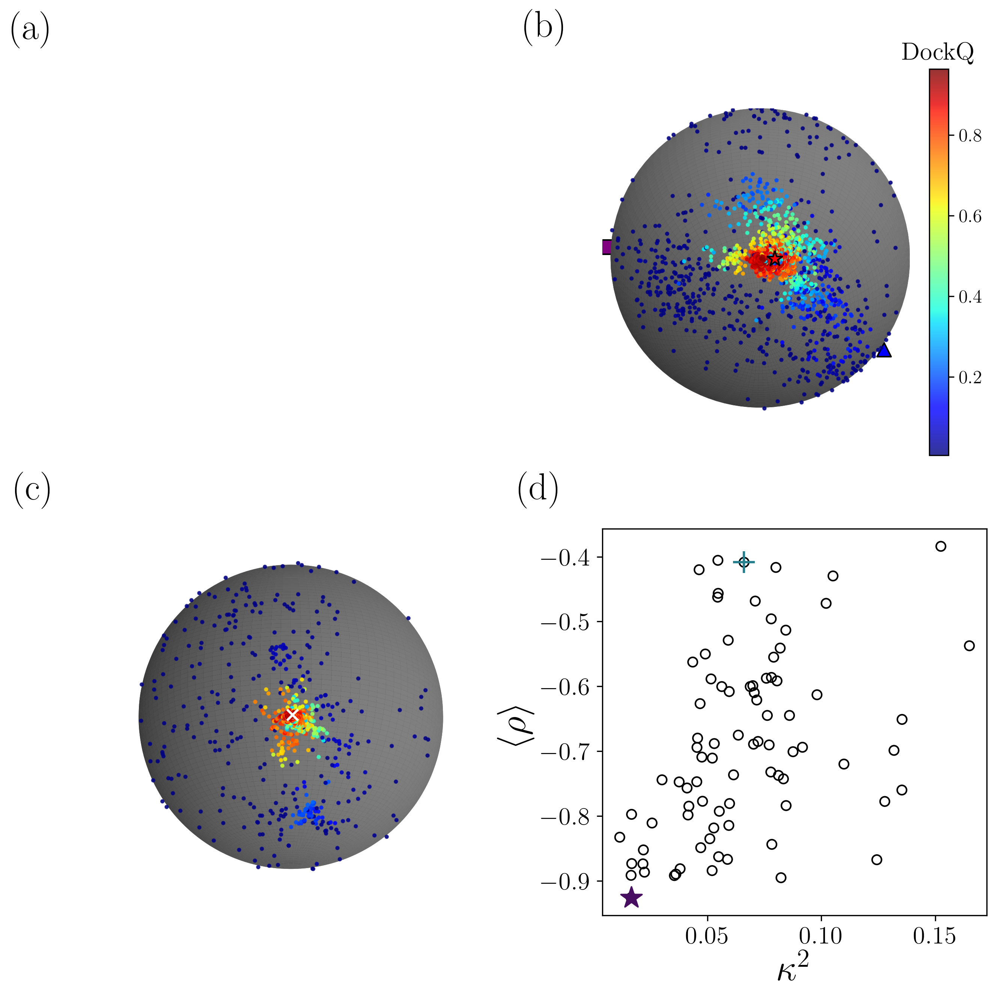

In [49]:
## Plotting everything together

%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable

# fig, ax = plt.subplots(2, 2, figsize = (8,8), dpi = 300)

fig = plt.figure(figsize = (9,9), dpi = 300)

num_samples = len(ss_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

#### Panel A ####

## Fake panel that will be the placeholder for the diagram

ax = fig.add_subplot(2,2,1)

ax.axis("off")

ax.set_xticks([])
ax.set_yticks([])

ax.text(-0.1, 1.15, f"(a)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


#### Panel B ####

ax = fig.add_subplot(2, 2, 2,projection='3d')

## Get the data

pdb_id = "2grn"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]

## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = temp_pdb_df["DockQ"], 
                      cmap = "jet", alpha = 0.8, s = 3)


## Add target X in there

scale_factor = 1.1
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "*", color = "black",facecolor = "red", s = 100)

## Add colorbar

b_cbar = fig.colorbar(tmp_scat)

b_cbar.ax.set_title("DockQ", fontsize = fontsize)

## Try to highlight some points

# decoy_name = "complex.0_19_3"

# tmp_df = norm_sphere_df[norm_sphere_df["Decoy"] == decoy_name]

# com_x = tmp_df["com_x"]  
# com_y = tmp_df["com_y"]    
# com_z = tmp_df["com_z"]

# scalar = 1.05

# potato = ax.scatter(com_x * scalar, com_y  * scalar, com_z  * scalar, 
#                     marker = "*",color = "black", alpha = 1, s = 100, facecolor = "red")


## Try to highlight some points

decoy_name = "complex.2_0_42"

tmp_df = norm_sphere_df[norm_sphere_df["Decoy"] == decoy_name]

com_x = tmp_df["com_x"]  
com_y = tmp_df["com_y"]    
com_z = tmp_df["com_z"]

scalar = 1.02

potato = ax.scatter(com_x * scalar, com_y  * scalar, com_z  * scalar, 
                    marker = "^",color = "black", alpha = 1, s = 80, facecolor = "blue")


## Try to highlight some points

decoy_name = "complex.4_0_47"

tmp_df = norm_sphere_df[norm_sphere_df["Decoy"] == decoy_name]

com_x = tmp_df["com_x"]  
com_y = tmp_df["com_y"]    
com_z = tmp_df["com_z"]

scalar = 1.06

potato = ax.scatter(com_x * scalar, com_y  * scalar, com_z  * scalar, 
                    marker = "s",color = "black", alpha = 1, s = 80, facecolor = "purple")


# fig.colorbar(tmp_scat)

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(1400, 200, z = 2000, s = "(b)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -65
y_view = 15

ax.view_init(x_view, y_view, "z")

t_lim = 20
blims = -t_lim
tlims = t_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

#### Panel C ####

ax = fig.add_subplot(2, 2, 3,projection='3d')

## Get the data

pdb_id = "3whq"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]

## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = temp_pdb_df["DockQ"], 
                      cmap = "jet", alpha = 0.8, s = 3)

## Add target X in there

scale_factor = 1.1
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "x", color = "white", s = 50)

## Formatting

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(0, -50, z = 640, s = "(c)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -20
y_view = 0

ax.view_init(x_view, y_view, "z")


temp_lim = 16
blims = -temp_lim
tlims = temp_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

#### Panel D ####

score_ref = ["spearman_dockq_zrank", "spearman_dockq_itscorepp", "spearman_dockq_rosetta",
             "spearman_dockq_pydock", "spearman_dockq_voromqa","spearman_dockq_deeprank_gnn_esm"]
spearman_data = np.zeros((len(score_ref),num_samples))

for i in range(len(score_ref)):
    for j in range(num_samples):
        if "deeprank" in score_ref[i] or "voromqa" in score_ref[i]:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j] * -1
        else:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j]

mean_data = np.mean(spearman_data, axis = 0)

stdev_data = np.std(spearman_data, axis = 0)

sorted_data = spearman_data[:, mean_data.argsort()]

sorted_mean_data = mean_data[mean_data.argsort()]

sorted_stdev_data = stdev_data[mean_data.argsort()]

ax = fig.add_subplot(2, 2, 4)

col_ob = ax.scatter(k2_data, mean_data, facecolor = "None", color = "black", marker = "o")

ax.set_xlabel(r"$\kappa^2$", fontsize = 24)
ax.set_ylabel(r"$\langle \rho \rangle$", fontsize = 24)

## Set the X ticks
ax.set_xticks([0,0.05, 0.10, 0.15])

pdb_list = list(ss_corr_df["pdb"])

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(-0.1, 1.15, f"(d)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


## Highlighting the points on the plot

first_ind = list(ss_corr_df["pdb"]).index("3whq")
second_ind = list(ss_corr_df["pdb"]).index("2grn")

ax.scatter(k2_data[first_ind], mean_data[first_ind], marker = "*", s = 200, color = (0.277018, 0.050344, 0.375715, 1. ))
ax.scatter(k2_data[second_ind], mean_data[second_ind], marker = "+", s = 200, color = (0.151918, 0.500685, 0.557587, 1. ))


fig.tight_layout()
plt.savefig(join(figure_save_dir, "bullseye_analysis.png"))

## Figure 6

84


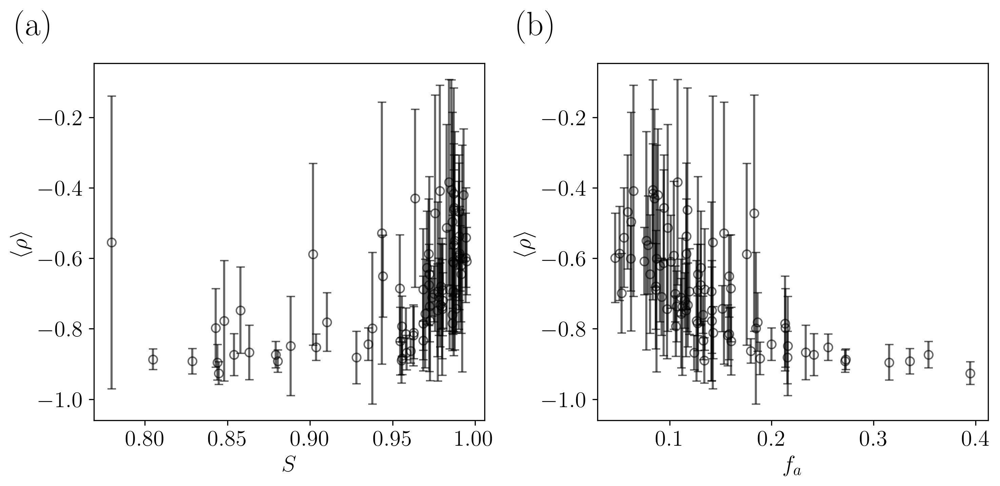

In [50]:
## Final Flatness Correlation Figure - NO DOVE Averaged together

fig, ax = plt.subplots(1,2,figsize = (10,5), dpi = 300)

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

font_size = 16

## Interface Flatness

flatness_avg = [
    np.array(ss_corr_df["spearman_dockq_zrank"]), np.array(ss_corr_df["spearman_dockq_itscorepp"]), 
    np.array(ss_corr_df["spearman_dockq_rosetta"]), ss_corr_df["spearman_dockq_pydock"], 
    np.array(ss_corr_df["spearman_dockq_voromqa"])*-1, np.array(ss_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1
]

flatness_avg = np.array(flatness_avg)
flatness_std = np.std(flatness_avg, axis = 0)
flatness_avg = np.mean(flatness_avg, axis = 0)
print(len(flatness_avg))

ax[0].errorbar(ss_corr_df["flatness_p3"], flatness_avg, yerr = flatness_std, color = "black", marker = "o",  
               markerfacecolor = "None", ls = "None", alpha = 0.6, capsize = 3)


ax[0].set_xlabel("$S$", fontsize = font_size)
ax[0].set_ylabel(r"$\langle \rho \rangle$", fontsize = font_size)

## Relative Interface Surface Area

ax[1].errorbar(ss_corr_df["relative_interface_sasa"], flatness_avg, yerr = flatness_std, color = "black", marker = "o",  
               markerfacecolor = "None", ls = "None", alpha = 0.6, capsize = 3)

ax[1].set_xlabel("$f_{a}$", fontsize = font_size)
ax[1].set_ylabel(r"$\langle \rho \rangle$", fontsize = font_size)


ax[0].text(-0.1, 1.15, "(a)", transform=ax[0].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[1].text(-0.1, 1.15, "(b)", transform=ax[1].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=font_size)

fig.tight_layout()
plt.savefig(join(figure_save_dir, "flatness_and_rel_interface_no_dove_avg.png"))

## Figure 7

In [51]:
def perform_pca(corr_df, cols, n_components = 2):
    '''
    Performs PCA using Scikit-learn on the data
    and with n_components. The output will
    be in the form of the principal components
    array
    '''
    
    ## Save data in dataframe to numpy array
    data = np.zeros((len(corr_df), n_components))
    
    for i in range(n_components):
        temp_data = np.array(corr_df[cols[i]])
        z_normalized = (temp_data - np.mean(temp_data))/np.std(temp_data)
        data[:,i] = z_normalized
    
    print(data.shape)
    ## Perform PCA
    pca = PCA(n_components)
    pca.fit(data)
    ev = pca.explained_variance_ratio_
    for i in range(n_components):
        print(f"Explained variance for PC{i+1}: {ev[i]}")
    return pca.transform(data)

In [52]:
### Creating a combination of the 3 physical scores using PCA per each target at a time

cols_to_add = ["pdb", "spearman_pca", "pearson_pca"]
physical_pca_scores_dict = {}
physical_pca_dict = {col : [] for col in cols_to_add}
pca_cols = ["Intertwined", "Contact_45", "Interface_rsa"]

for pdb in list(ss_corr_df["pdb"]):
    target_df_temp = ss_score_dict[pdb]
    print(pdb)
    temp_pca = perform_pca(target_df_temp, pca_cols, n_components=len(pca_cols))
    
    ## Store the PCA scores to be plotted if necessary
    physical_pca_scores_dict[pdb] = temp_pca
    
    ## Get the Pearson and Spearman correlations between PC1 and DockQ
    
#     print(len(temp_pca[:,0]))
#     print(len(np.array(target_df_temp["DockQ"])))
    
    temp_pearson = pearsonr(temp_pca[:,0], np.array(target_df_temp["DockQ"]))[0]
    temp_spearman = spearmanr(temp_pca[:,0], np.array(target_df_temp["DockQ"]))[0]
    
    ## Add data to dict
    
    physical_pca_dict["pdb"].append(pdb)
    
    if temp_spearman > 0:
        physical_pca_dict["spearman_pca"].append(temp_spearman*-1)
    else:
        physical_pca_dict["spearman_pca"].append(temp_spearman)
    
    if temp_pearson > 0:
        physical_pca_dict["pearson_pca"].append(temp_pearson*-1)
    else:
        physical_pca_dict["pearson_pca"].append(temp_pearson)
        
physical_pca_df = pd.DataFrame(physical_pca_dict)

1acb
(1394, 3)
Explained variance for PC1: 0.7369837796604273
Explained variance for PC2: 0.1877206098174782
Explained variance for PC3: 0.07529561052209446
1ay7
(1352, 3)
Explained variance for PC1: 0.8196925145221494
Explained variance for PC2: 0.14005978190799745
Explained variance for PC3: 0.040247703569853154
1c3a
(1330, 3)
Explained variance for PC1: 0.9027216422601226
Explained variance for PC2: 0.07972198977025015
Explained variance for PC3: 0.017556367969627257
1euv
(1392, 3)
Explained variance for PC1: 0.931786647069002
Explained variance for PC2: 0.04108007566223736
Explained variance for PC3: 0.027133277268760598
1f60
(1348, 3)
Explained variance for PC1: 0.9232897690172509
Explained variance for PC2: 0.06226213453205564
Explained variance for PC3: 0.01444809645069342
1ggp
(1260, 3)
Explained variance for PC1: 0.9107810292499698
Explained variance for PC2: 0.050143943830240095
Explained variance for PC3: 0.03907502691979015
1itb
(1214, 3)
Explained variance for PC1: 0.83320

7bxh
(1260, 3)
Explained variance for PC1: 0.7816757632776249
Explained variance for PC2: 0.18833183471861834
Explained variance for PC3: 0.02999240200375676
7joe
(1344, 3)
Explained variance for PC1: 0.881545759487885
Explained variance for PC2: 0.07944455801673617
Explained variance for PC3: 0.039009682495378714
7jxv
(1414, 3)
Explained variance for PC1: 0.6681003667152215
Explained variance for PC2: 0.2571666885460285
Explained variance for PC3: 0.07473294473875007
8enf
(1262, 3)
Explained variance for PC1: 0.859225907600323
Explained variance for PC2: 0.1216116283815208
Explained variance for PC3: 0.019162464018156234


In [63]:
svr_dir = "/Users/jakesumner/Desktop/PPI Project/supersampling/physical_score_svr/"

os.chdir(svr_dir)

def read_in_svr_data(svr_dir, score_dict):
    '''
    Takes the svr_dir and turns all 
    the data for all 4 kernels into a 
    df for each PDB, similar to the score
    dict. It returns the pearson and spearman
    correlations for each PDB for each 
    kernel function
    '''
    
    ## Read in all files
    svr_files = sorted([f for f in listdir(svr_dir) if isfile(join(svr_dir, f)) and "results.txt" in f])
    
    ## Init dict
    cols_to_add = ["pdb", "svr_rbf_pearson", "svr_rbf_spearman", "svr_sigmoid_pearson", "svr_sigmoid_spearman",
                  "svr_linear_pearson", "svr_linear_spearman", "svr_poly_pearson", "svr_poly_spearman",]
    final_dict = {col : [] for col in cols_to_add}
    final_score_dict = {}
    
    ## Sort files appropriately so all are in same order
    gaussian_files = sorted([f for f in svr_files if "rbf" in f])
    linear_files = sorted([f for f in svr_files if "linear" in f])
    poly_files = sorted([f for f in svr_files if "poly" in f])
    sigmoid_files = sorted([f for f in svr_files if "sigmoid" in f])
    
    ## Get Gaussian Corrs
    for tempfile in gaussian_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        
        ## Isolate and add PDB to dictionary (just this time)
        curr_pdb = tempfile.split("_")[3]
        final_dict["pdb"].append(curr_pdb)
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Add data to the final_score_dict (only gaussian because it is the best)
        final_score_dict[curr_pdb] = pd.DataFrame(temp_data)
        
        ## Calculate correlations
#         if curr_pdb == "3u82":
#             print(curr_pdb, len(score_dict[curr_pdb]["DockQ"]), len(temp_data["pred_y"]))
#             for i in range(len(temp_data["decoy"])):
#                 if temp_data["decoy"][i] != list(score_dict[curr_pdb]["Decoy"])[i]:
#                     print(i, temp_data["decoy"][i], list(score_dict[curr_pdb]["Decoy"])[i], temp_data["decoy"][i+1])
#                     break
#             for i in reversed(range(len(temp_data["decoy"]))):
#                 if temp_data["decoy"][i] != list(score_dict[curr_pdb]["Decoy"])[i]:
#                     print(i, temp_data["decoy"][i], list(score_dict[curr_pdb]["Decoy"])[i], temp_data["decoy"][i])
#                     break
#             continue
        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_rbf_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_rbf_spearman"].append(temp_spearman)
        
    ## Get sigmoid Corrs
    for tempfile in sigmoid_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        curr_pdb = tempfile.split("_")[3]
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Calculate correlations
#         print(tempfile, curr_pdb, len(temp_data["pred_y"]), len(score_dict[curr_pdb]["DockQ"]))
        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_sigmoid_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_sigmoid_spearman"].append(temp_spearman)
        
    ## Get linear Corrs
    for tempfile in linear_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        curr_pdb = tempfile.split("_")[3]
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Calculate correlations

        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_linear_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_linear_spearman"].append(temp_spearman)
        
    ## Get Poly Corrs
    for tempfile in poly_files:
        temp_data = {"decoy" : [], "pred_y" : []}
        curr_pdb = tempfile.split("_")[3]
        with open(tempfile, "r") as f:
            count = 0
            for line in f:
                if curr_pdb == "3u82":
                    if count not in [359, 903]:
                        line = line.split()
                        temp_decoy = line[0]
                        temp_score = float(line[1])
                        temp_data["decoy"].append(temp_decoy)
                        temp_data["pred_y"].append(temp_score)
                    count += 1
                else:
                    line = line.split()
                    temp_decoy = line[0]
                    temp_score = float(line[1])
                    temp_data["decoy"].append(temp_decoy)
                    temp_data["pred_y"].append(temp_score)
                    count += 1
                
        ## Calculate correlations

        temp_pearson = pearsonr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_poly_pearson"].append(temp_pearson)
        
        temp_spearman = spearmanr(temp_data["pred_y"], score_dict[curr_pdb]["DockQ"])[0]
        final_dict["svr_poly_spearman"].append(temp_spearman)
        
    return pd.DataFrame(final_dict), final_score_dict

def create_ROC_data_struc_dockq(score_df, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Takes the score_df (DataFrame) and a given 'col_name' which corresponds to one of the columns 
    in the dataframe and some quality metric, which is what treats the data as a true positive. 
    True positives are labeled with a 1 and false positives are labeled with a 0.
    '''
    
    temp_scores = score_df[col_name]
    temp_dockq = score_df["DockQ"]
    
    ## Get the label array for the capri scores
    score_mask = np.zeros(temp_dockq.size)
    for i in range(len(score_mask)):
        if temp_dockq[i] >= dockq_cutoff:
            score_mask[i] = 1
    
    return score_mask, temp_scores

def get_indiv_ROC_curve(df_dict, col_name = "ZRank", dockq_cutoff = 0.23):
    '''
    Simply aggregates all the score and label data across all targets in a dataframe and 
    then turns them into ROC curve data
    '''
    temp_keys = list(df_dict.keys())
    agg_mask = []
    agg_scores = []
    all_roc_curves = []
    all_roc_aucs = []
    for key in temp_keys:
        temp_mask, temp_scores = create_ROC_data_struc_dockq(df_dict[key], col_name = col_name, dockq_cutoff = dockq_cutoff)
        all_roc_curves.append(metrics.roc_curve(temp_mask, -1*np.array(temp_scores), pos_label=1))
        all_roc_aucs.append(metrics.roc_auc_score(temp_mask, -1*np.array(temp_scores)))
    
    return all_roc_curves, all_roc_aucs, temp_keys
        

In [64]:
## Get the SVR correlation dictionary

svr_overall_df, svr_score_dict = read_in_svr_data(svr_dir, ss_score_dict)

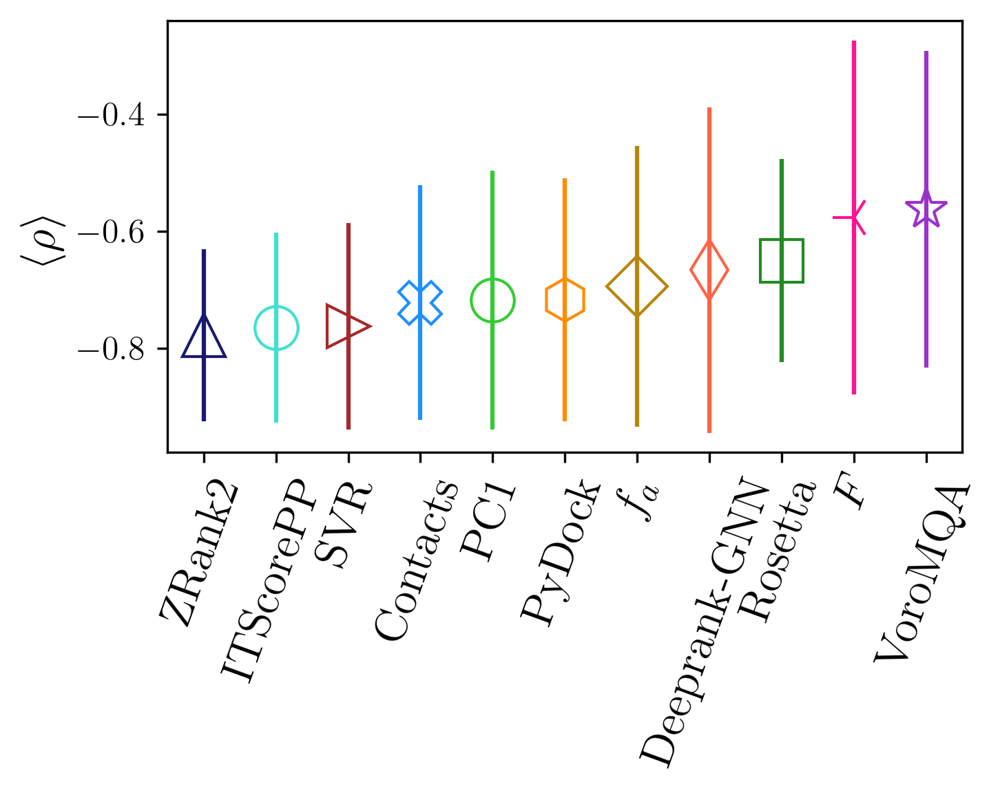

In [65]:
## Show a plot of the average spearman BUT NO DOVE

fig, ax = plt.subplots(figsize = (5,4), dpi = 300)

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "tomato",
         "deeppink", "dodgerblue", "darkgoldenrod", "brown", "limegreen"]

markers = ["^", "o", "s", "h", "*", "d", "3", "X", "D", ">", "o"]

ss_plot_data = [np.mean(ss_corr_df["spearman_dockq_zrank"]), np.mean(ss_corr_df["spearman_dockq_itscorepp"]),
                    np.mean(ss_corr_df["spearman_dockq_rosetta"]), np.mean(ss_corr_df["spearman_dockq_pydock"]),
                    np.mean(ss_corr_df["spearman_dockq_voromqa"]*-1), 
                    np.mean(ss_corr_df["spearman_dockq_deeprank_gnn_esm"]*-1), np.mean(ss_corr_df["spearman_dockq_intertwined"]),
                    np.mean(ss_corr_df["spearman_dockq_contact_45"])*-1, np.mean(ss_corr_df["spearman_dockq_interface_rsa"])*-1,
                    np.mean(svr_overall_df["svr_rbf_spearman"]) *-1, np.mean(physical_pca_df["spearman_pca"])
               ]


ss_plot_std = [np.std(ss_corr_df["spearman_dockq_zrank"]), np.std(ss_corr_df["spearman_dockq_itscorepp"]),
                    np.std(ss_corr_df["spearman_dockq_rosetta"]), np.std(ss_corr_df["spearman_dockq_pydock"]),
                    np.std(ss_corr_df["spearman_dockq_voromqa"]*-1), 
                      np.std(ss_corr_df["spearman_dockq_deeprank_gnn_esm"]*-1), np.std(ss_corr_df["spearman_dockq_intertwined"]),
                    np.std(ss_corr_df["spearman_dockq_contact_45"])*-1, np.std(ss_corr_df["spearman_dockq_interface_rsa"])*-1,
                    np.std(svr_overall_df["svr_rbf_spearman"]), np.std(physical_pca_df["spearman_pca"])
              ]

x_axis = range(len(ss_plot_data))


## Sort the data 
ss_plot_data = np.array(ss_plot_data)
ss_plot_std = np.array(ss_plot_std)
colors = np.array(colors)
markers = np.array(markers)

sort_inds = np.argsort(ss_plot_data)
ss_plot_data = ss_plot_data[sort_inds]
ss_plot_std = ss_plot_std[sort_inds]
colors = colors[sort_inds]
markers = markers[sort_inds]

score_list = ["ZRank2", "ITScorePP", "Rosetta",  "PyDock", "VoroMQA",  "Deeprank-GNN", 
             "$F$", "Contacts", "$f_{a}$", "SVR", "PC1"]

score_list = np.array(score_list)
score_list = score_list[sort_inds]

for i in range(len(ss_plot_data)):
    plt.errorbar(x_axis[i], ss_plot_data[i], yerr = ss_plot_std[i], color = colors[i], marker = markers[i], 
                 label = score_list[i], markerfacecolor = "None", markersize = 15, alpha = 1)

plt.xticks(x_axis, score_list, fontsize = 16, rotation = 70)

ax.set_ylabel(r"$\langle \rho \rangle$", fontsize = 16)
fig.tight_layout()
# plt.legend()
plt.savefig(join(figure_save_dir, "simple_spearman_graph_with_physical_and_combined.png"))

In [69]:
## Add the SVR score to the ss_score_dict

for pdb, temp_df in list(ss_score_dict.items()):
    
    svr_row = list(svr_score_dict[pdb]["pred_y"])
    temp_df["SVR"] = svr_row
    ss_score_dict[pdb] = temp_df



In [70]:
## temporarily remove the 3 problem PDBs from the dataset
temp_ss_score_dict = ss_score_dict.copy()
del temp_ss_score_dict["2wmp"]
del temp_ss_score_dict["4je3"]
del temp_ss_score_dict["2bkr"]

In [71]:
## Generate all the data

def get_sorted_rankings(aucs, pdb_list, rankings_df, rankings_col):
    '''
    Helper function to return the rankings according
    to the AUCS entered so that the Kendall-Tau 
    correlations can be properly calculated.
    Outputs the kendall tau
    '''
    if len(aucs) != len(pdb_list):
        print("AUC LENGTH AND PDB LIST LENGTH DO NOT MATCH")
        return 1
    
    ## Get rankings
    rankings = np.array(range(1, len(pdb_list) + 1))
    
    aucs = np.array(aucs)
    pdb_list = np.array(pdb_list)
    
    ## Get sort indices
    sort_indices = np.argsort(aucs)
    
    aucs = aucs[sort_indices]
    pdb_list = pdb_list[sort_indices]
    
    ## Make the DF
    temp_df = pd.DataFrame({
        "pdb" : pdb_list,
        "temp_aucs" : aucs,
        "temp_rankings" : rankings
    })
    
    ## Merge the two DFs so they are in the same order
    merged_df = rankings_df.merge(temp_df, on = "pdb")
    
    ## Get the kendall tau
    kendall_tau = kendalltau(merged_df[rankings_col], merged_df["temp_rankings"])
    
    return kendall_tau[0]

dockq_cutoffs = np.linspace(0.2, 0.8, 61)
scoring_functions = ["ZRank","itscorepp", "Rosetta", "PyDock", "VoroMQA", "Deeprank_gnn_esm", "SVR"]

dockq_sweep_data = []
dockq_kendall_tau_spearman = []
for score_fxn in scoring_functions:
    temp_dockq_data = []
    temp_kt_data = []
    for cutoff in dockq_cutoffs:
        temp_roc_curve, temp_roc_auc, test_keys = get_indiv_ROC_curve(temp_ss_score_dict, col_name = score_fxn, dockq_cutoff = cutoff)
        
        temp_dockq_data.append(np.mean(temp_roc_auc))
        
        ## Get the kendall_tau 
#         temp_kt = get_sorted_rankings(temp_roc_auc, test_keys, fixed_ranking_df, "spearman_rankings")
#         temp_kt_data.append(temp_kt)
    
    dockq_sweep_data.append(temp_dockq_data)
    dockq_kendall_tau_spearman.append(temp_kt_data)
    

-0.7778650238671891 ZRank2
-0.7651507256727287 ITScorePP
-0.7632151174344657 SVR
-0.7223788977864369 $N_c$
-0.717355098755422 PyDock
-0.6944086208028121 $f_{a}$
-0.6665828036466228 Deeprank-GNN
-0.6506983629319282 Rosetta
-0.5766304721937426 $S$
-0.5627008089087742 VoroMQA


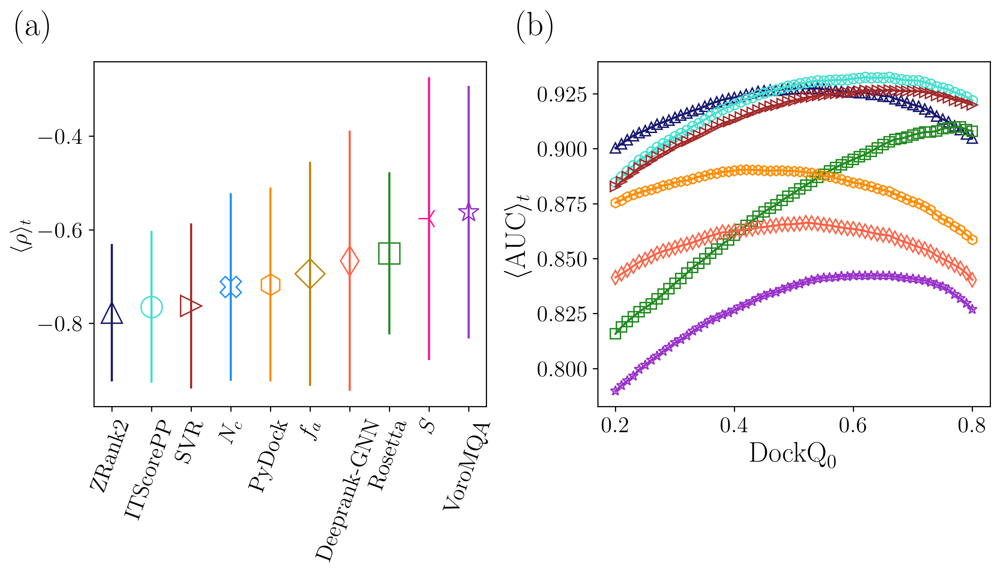

In [72]:
## Show a plot of the average spearman BUT NO DOVE

%matplotlib inline

fig, ax = plt.subplots(1,2,figsize = (10,6), dpi = 300)
dockq_cutoffs = np.linspace(0.2, 0.8, 61)

#### Panel A ####

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "tomato",
         "deeppink", "dodgerblue", "darkgoldenrod", "brown"]

markers = ["^", "o", "s", "h", "*", "d", "3", "X", "D", ">"]

ss_plot_data = [np.mean(ss_corr_df["spearman_dockq_zrank"]), np.mean(ss_corr_df["spearman_dockq_itscorepp"]),
                    np.mean(ss_corr_df["spearman_dockq_rosetta"]), np.mean(ss_corr_df["spearman_dockq_pydock"]),
                    np.mean(ss_corr_df["spearman_dockq_voromqa"]*-1), 
                    np.mean(ss_corr_df["spearman_dockq_deeprank_gnn_esm"]*-1), np.mean(ss_corr_df["spearman_dockq_intertwined"]),
                    np.mean(ss_corr_df["spearman_dockq_contact_45"])*-1, np.mean(ss_corr_df["spearman_dockq_interface_rsa"])*-1,
                    np.mean(svr_overall_df["svr_rbf_spearman"]) *-1
               ]


ss_plot_std = [np.std(ss_corr_df["spearman_dockq_zrank"]), np.std(ss_corr_df["spearman_dockq_itscorepp"]),
                    np.std(ss_corr_df["spearman_dockq_rosetta"]), np.std(ss_corr_df["spearman_dockq_pydock"]),
                    np.std(ss_corr_df["spearman_dockq_voromqa"]*-1), 
                      np.std(ss_corr_df["spearman_dockq_deeprank_gnn_esm"]*-1), np.std(ss_corr_df["spearman_dockq_intertwined"]),
                    np.std(ss_corr_df["spearman_dockq_contact_45"])*-1, np.std(ss_corr_df["spearman_dockq_interface_rsa"])*-1,
                    np.std(svr_overall_df["svr_rbf_spearman"])
              ]

x_axis = range(len(ss_plot_data))


## Sort the data 
ss_plot_data = np.array(ss_plot_data)
ss_plot_std = np.array(ss_plot_std)
colors = np.array(colors)
markers = np.array(markers)

sort_inds = np.argsort(ss_plot_data)
ss_plot_data = ss_plot_data[sort_inds]
ss_plot_std = ss_plot_std[sort_inds]
colors = colors[sort_inds]
markers = markers[sort_inds]

score_list = ["ZRank2", "ITScorePP", "Rosetta",  "PyDock", "VoroMQA",  "Deeprank-GNN", 
             "$S$", "$N_c$", "$f_{a}$", "SVR"]

score_list = np.array(score_list)
score_list = score_list[sort_inds]

for i in range(len(ss_plot_data)):
    print(ss_plot_data[i], score_list[i])
    ax[0].errorbar(x_axis[i], ss_plot_data[i], yerr = ss_plot_std[i], color = colors[i], marker = markers[i], 
                 label = score_list[i], markerfacecolor = "None", markersize = 15, alpha = 1)

ax[0].set_xticks(x_axis, score_list, fontsize = 16, rotation = 70)

ax[0].set_ylabel(r"$\langle \rho \rangle_t$", fontsize = 16)


#### Panel B ####

## Plot the AUC as the DockQ Changes

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "tomato", "brown"]

markers = ["^", "o", "s", "h", "*", "d", '>']

labels = ["Zrank2", "ITScorePP", "Rosetta", "PyDock", "VoroMQA", "Deeprank_GNN_ESM", "SVR"]

for i in range(len(labels)):
    if i < 4:
        ax[1].plot(dockq_cutoffs, dockq_sweep_data[i], marker = markers[i], color = colors[i], label = labels[i], markerfacecolor = "None", ms = 7)
    else:
        ax[1].plot(dockq_cutoffs, 1- np.array(dockq_sweep_data[i]), marker = markers[i], color = colors[i], label = labels[i], markerfacecolor = "None", ms = 7)

ax[1].set_xlabel(r"$\rm{DockQ}_{0}$", fontsize = 20) 
ax[1].set_ylabel(r"$\langle$AUC$\rangle_t$", fontsize = 20)

ax[1].tick_params(axis='both', which='major', labelsize=12)

## Formatting

ax[0].text(-0.1, 1.15, "(a)", transform=ax[0].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[1].text(-0.1, 1.15, "(b)", transform=ax[1].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=font_size)


fig.tight_layout()
plt.savefig(join(figure_save_dir, "combined_spearman_and_auc_cutoff.png"))

# Supplementary Figures

## Figure S1

SpearmanrResult(correlation=-0.2564238599384542, pvalue=6.761483163873358e-150)
AUC 0.9590549604565021


/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_36036/408420658.py:7: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if bins == []:


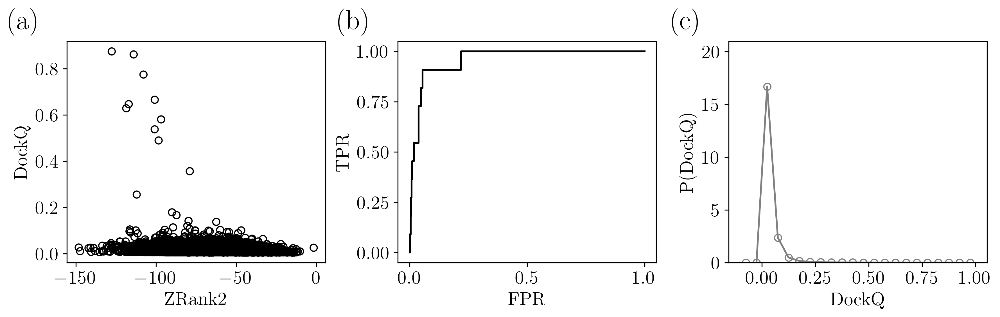

In [81]:
%matplotlib inline
fig,ax = plt.subplots(1,3, dpi =300, figsize = (12,4))

def get_indiv_ROC_curve(score_df, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1):
    '''
    Simply aggregates all the score and label data across all targets in a dataframe and 
    then turns them into ROC curve data
    '''
    
    temp_mask, temp_scores = create_ROC_data_struc_dockq(score_df, col_name = col_name, dockq_cutoff = dockq_cutoff)
    roc_curve = metrics.roc_curve(temp_mask, factor*np.array(temp_scores), pos_label=1)
    roc_auc = metrics.roc_auc_score(temp_mask, factor*np.array(temp_scores))
    
    return roc_curve, roc_auc

#### Panel A ####

## Scatterplot of 1xg2

ex_data_1xg2 = exhaustive_score_dict["1xg2"]

score_fxn = "ZRank"
gt_fxn = "DockQ"

ax[0].scatter(ex_data_1xg2[score_fxn], ex_data_1xg2[gt_fxn], color = "black", marker = "o", facecolor = "None")

ax[0].set_xlabel("ZRank2", fontsize = font_size)
ax[0].set_ylabel("DockQ", fontsize = font_size)

print(spearmanr(ex_data_1xg2[score_fxn], ex_data_1xg2[gt_fxn]))


#### Panel B ####

roc_curve, roc_auc = get_indiv_ROC_curve(ex_data_1xg2, col_name = "ZRank", dockq_cutoff = 0.23, factor = -1)

print("AUC", roc_auc)

ax[1].plot(roc_curve[0], roc_curve[1], color = "black")

ax[1].set_xlabel("FPR", fontsize = font_size)
ax[1].set_ylabel("TPR", fontsize = font_size)

#### Panel C ####

## Averaged DockQ for Exhaustive Data

nbins = 23
bins = np.linspace(-0.1, 1, nbins)

dockq_arr = np.zeros((len(exhaustive_score_dict), nbins-1))

for i,pdb_name in enumerate(list(exhaustive_score_dict.keys())):

    temp_x, temp_y = create_prob_dist_identical_bins_dockq(exhaustive_score_dict[pdb_name]["DockQ"], fig, ax[2], bins = bins, color = "black", label = None, alpha = 1.0, marker = "o")
    dockq_arr[i,:] = temp_y
        
avg_dockq = np.mean(dockq_arr, axis = 0)

ax[2].plot(temp_x, avg_dockq, color = "gray", marker = "o", markerfacecolor = "None", label = "Averaged")

ax[2].set_xlabel("DockQ", fontsize = font_size)
ax[2].set_ylabel("P(DockQ)", fontsize = font_size)

ax[2].set_xticks([0, 0.25, 0.5, 0.75, 1.0])

#### FORMATTING ####

letters = ['a', 'b', 'c']
for i in range(3):
    ax[i].tick_params(axis='both', which='major', labelsize=font_size)
    ax[i].text(-0.1, 1.15, f"({letters[i]})", transform=ax[i].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')


fig.tight_layout()
plt.savefig(join(figure_save_dir, "simple_intro_fig_1xg2.png"))

## Figure S2

In [74]:
from scipy.stats import spearmanr

def create_random_mask(n):
    
    rng = np.random.Generator(np.random.PCG64())
    rng = np.random.default_rng()

    # generates 0 or 1 randomly
    value = rng.integers(low=0, high=2, size=n)

    choice_a = np.array([-1,1])
    mask = np.random.choice(choice_a, size = n)
    
    return value*mask

def create_distribution_with_given_fraction(score_df, var_frac):
    '''
    Randomly varies the points of the negatives while keeping the
    positives static. Terminates when the fraction of the 
    [n(neg) < min(pos)]/n(neg) goes below the
    "var_frac" parameter
    '''
    
    ## Split the score_df into positives and negatives
    
    pos_x_data = score_df[score_df["DockQ"] >= 0.23]["ZRank"]
    pos_y_data = score_df[score_df["DockQ"] >= 0.23]["DockQ"]
    neg_x_data = np.array(score_df[score_df["DockQ"] < 0.23]["ZRank"])
    neg_y_data = score_df[score_df["DockQ"] < 0.23]["DockQ"]
    
    len_negs = len(neg_x_data)
    
    
    ## Define the perturbation that can happen with each step
    eta = 0.005
    
    ## initialize the current correlation value
    frac_curr = 0
    
    safety_count = 1000000 ## Just to avoid an infinite loop
    i = 0
    pos_min = min(pos_x_data)
    while True:
        if i > safety_count:
            print("SAFETY COUNT REACHED")
            break
        ## Create random array for x
        
        if frac_curr >= var_frac:
            break
        
        rand_x = create_random_mask(len_negs) * eta
        
        ## Apply the random array to x, which determines whether the points move
        
        neg_x_data = neg_x_data + rand_x
        
        ## Calculate the variance fraction!
    
        frac_curr = len(neg_x_data[neg_x_data < pos_min])/len(neg_x_data)
        
        i+=1
        
    
    ## Recreate the DF for output purposes
    
    temp_dict = {"ZRank" : [], "DockQ" : []}
    
    temp_dict["ZRank"] += list(pos_x_data)
    temp_dict["ZRank"] += list(neg_x_data)
    temp_dict["DockQ"] += list(pos_y_data)
    temp_dict["DockQ"] += list(neg_y_data)
    
    
    print(frac_curr)
    return pd.DataFrame(temp_dict)
    

def get_cutoff_imbalanced_set(cutoff_x, df_list, imbalance_fraction = 0.5):

    unbalanced_list_95 = []

    sample_list = [500, 1000, 2000, 5000, 10000, 15000, 30000, 45000]

    score_fxn = 'ZRank' ## again, placeholder for the "score"

    hit_rate_list_95 = []

    for i in range(5):
        print(i)
        temp_unbal_list = create_unbalanced_dataset(df_list[i], imbalance_fraction, cutoff_x = cutoff_x)
        unbalanced_list_95.append(temp_unbal_list)
        hit_rate_list_95.append(sample_for_hit_rate_test_supp(temp_unbal_list, sample_list, score_col = score_fxn, dockq_cutoff = 0.23))
        
    return unbalanced_list_95, hit_rate_list_95

def create_unbalanced_dataset(example_df, imbalance_fraction, cutoff_x = -100000, cutoff_y = 0.23):
    
    '''
    Imbalance fraction is how much of the data you want below the cutoff
    '''
    
    ## Apply both cutoffs to the high data
    high_df = example_df[example_df["DockQ"] >= cutoff_y]
    high_df = high_df[high_df["ZRank"]>= cutoff_x]
    
    low_df = example_df[example_df["DockQ"] < cutoff_y]

    
    total_num = round(len(low_df)/imbalance_fraction)
    high_num = total_num - len(low_df)
    
    high_df_sample = high_df.sample(n = high_num, replace = False)

    combined_df = pd.concat([high_df_sample, low_df])
    
    return combined_df

def make_hit_rate_plot_sample_supp(sample_list, column = "ZRank", top_ranks = 50, dockq_cutoff = 0.23):
    '''
    Makes a hit rate plot from the score_dict. Hit rate is calculated based
    on the column name provided and the hit rate plot is calculated up to the
    top_ranks specified
    '''
    
    hit_rate_final = np.zeros((len(sample_list),top_ranks)) ## Create the hit rate plot y_axis
    hit_rate_x = range(1,top_ranks + 1)
    
    for i,temp_df in enumerate(sample_list):
        score_vals = np.array(temp_df[column]) ## gets the score column for each PDB
        dockq_vals = np.array(temp_df["DockQ"]) ## gets all of the CAPRI scores for the minimum
        
        ## Sorting the dataframes
        sort_vals = np.argsort(score_vals)
#         sort_vals = np.flip(sort_vals)
        score_vals = score_vals[sort_vals]
        dockq_vals = dockq_vals[sort_vals]
        
        hit_bool = False ## controls whether you found a positive
        for j in range(top_ranks):
            if dockq_vals[j] >= dockq_cutoff:
                ## Positive has been found in the top_ranks
                hit_bool = True
            if hit_bool:
                hit_rate_final[i,j] = 1
            else:
                hit_rate_final[i,j] = 0
                
    return np.mean(hit_rate_final, axis = 0), hit_rate_x


def sample_for_hit_rate_test_supp(score_df, sample_list, top_ranks = 100, score_col = "ZRank", dockq_cutoff = 0.5):
    '''
    Make a hit rate plot for each sample size in the sample
    list. Return a list of hit rate plot lists in the top_ranks. 
    '''
    
    ## init list to save hit rate data
    
    all_hit_rate_plots = []
    
    for n_samples in sample_list:
                
        temp_sample_list = []
        
        for i in range(1000):
            
            ## Get the random sample of the dataframe - no replacement
        
            temp_random_df = score_df.sample(n = n_samples, replace = False)
            
            temp_sample_list.append(temp_random_df)
            
        ## Get the hit rate and append to the list
        
        hit_rate_data, x_ax_vals = make_hit_rate_plot_sample_supp(temp_sample_list, column = score_col,
                                                             top_ranks = top_ranks, dockq_cutoff = dockq_cutoff)
        all_hit_rate_plots.append(hit_rate_data)
        
    return all_hit_rate_plots
    

In [75]:
## Read in all the data of the sample hit rate test

plot_data_dir = '/Users/jakesumner/Desktop/PPI Project/supersampling/correlation_supp_figure'

os.chdir(plot_data_dir)

## Corr = 0.9 Data

with open("random_corr_0.9_108000_0.001_X.pickle", "rb") as f:
    x_data_9 = pickle.load(f)
with open("random_corr_0.9_108000_0.001_Y.pickle", "rb") as f:
    y_data_9 = pickle.load(f)
    
## Corr = 0.7 Data
    
with open("random_corr_0.7_108000_0.001_X.pickle", "rb") as f:
    x_data_7 = pickle.load(f)
with open("random_corr_0.7_108000_0.001_Y.pickle", "rb") as f:
    y_data_7 = pickle.load(f)
    
## Corr = 0.5 Data
    
with open("random_corr_0.5_108000_0.001_X.pickle", "rb") as f:
    x_data_5 = pickle.load(f)
with open("random_corr_0.5_108000_0.001_Y.pickle", "rb") as f:
    y_data_5 = pickle.load(f)

## Corr = 0.3 Data
    
with open("random_corr_0.3_108000_0.001_X.pickle", "rb") as f:
    x_data_3 = pickle.load(f)
with open("random_corr_0.3_108000_0.001_Y.pickle", "rb") as f:
    y_data_3 = pickle.load(f)

## Corr = 0.1 Data

with open("random_corr_0.1_108000_0.005_X.pickle", "rb") as f:
    x_data_1 = pickle.load(f)
with open("random_corr_0.1_108000_0.005_Y.pickle", "rb") as f:
    y_data_1 = pickle.load(f)

In [76]:
## Normalize the x_data so it is all between 0 and 1

def normalize_numpy_arr(tmp_arr):
    '''
    Normalizes the array so that it is between 0 and 1 uniformly
    '''
    min_val = min(tmp_arr)
    max_val = max(tmp_arr)
    
    norm_arr = (tmp_arr - min_val)/(max_val - min_val)
    
    return norm_arr

norm_x_data_9 = normalize_numpy_arr(x_data_9)

norm_x_data_7 = normalize_numpy_arr(x_data_7)

norm_x_data_5 = normalize_numpy_arr(x_data_5)

norm_x_data_3 = normalize_numpy_arr(x_data_3)

norm_x_data_1 = normalize_numpy_arr(x_data_1)


In [77]:
## Make dataframes for the loaded in data - DockQ and Zrank are used as fake placeholders

dict_9 = {"DockQ" : y_data_9, "ZRank" : norm_x_data_9 * -1}
df_9 = pd.DataFrame(dict_9)

dict_7 = {"DockQ" : y_data_7, "ZRank" : norm_x_data_7 * -1}
df_7 = pd.DataFrame(dict_7)

dict_5 = {"DockQ" : y_data_5, "ZRank" : norm_x_data_5 * -1}
df_5 = pd.DataFrame(dict_5)

dict_3 = {"DockQ" : y_data_3, "ZRank" : norm_x_data_3 * -1}
df_3 = pd.DataFrame(dict_3)

dict_1 = {"DockQ" : y_data_1, "ZRank" : norm_x_data_1 * -1}
df_1 = pd.DataFrame(dict_1)

In [78]:
## Run the experiments

var_frac = 0
df_test_0 = create_distribution_with_given_fraction(df_1, var_frac)

var_frac = 1e-5
df_test_1e5 = create_distribution_with_given_fraction(df_1, var_frac)

var_frac = 5e-5
df_test_5e4 = create_distribution_with_given_fraction(df_1, var_frac)

var_frac = 1e-4
df_test_1e4 = create_distribution_with_given_fraction(df_1, var_frac)

var_frac = 5e-4
df_test_5e3 = create_distribution_with_given_fraction(df_1, var_frac)


df_list = [df_test_0, df_test_1e5, df_test_5e4, df_test_1e4, df_test_5e3]

min_test_1, min_test_hr_1 = get_cutoff_imbalanced_set(-5, df_list)

0
4.025764895330113e-05
8.051529790660226e-05
0.00012077294685990338
0.0005233494363929146
0
1
2
3
4


/var/folders/kr/4__h_fpn42334nd1tdtl4w8w0000gn/T/ipykernel_36036/1738902400.py:5: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if bins == []:


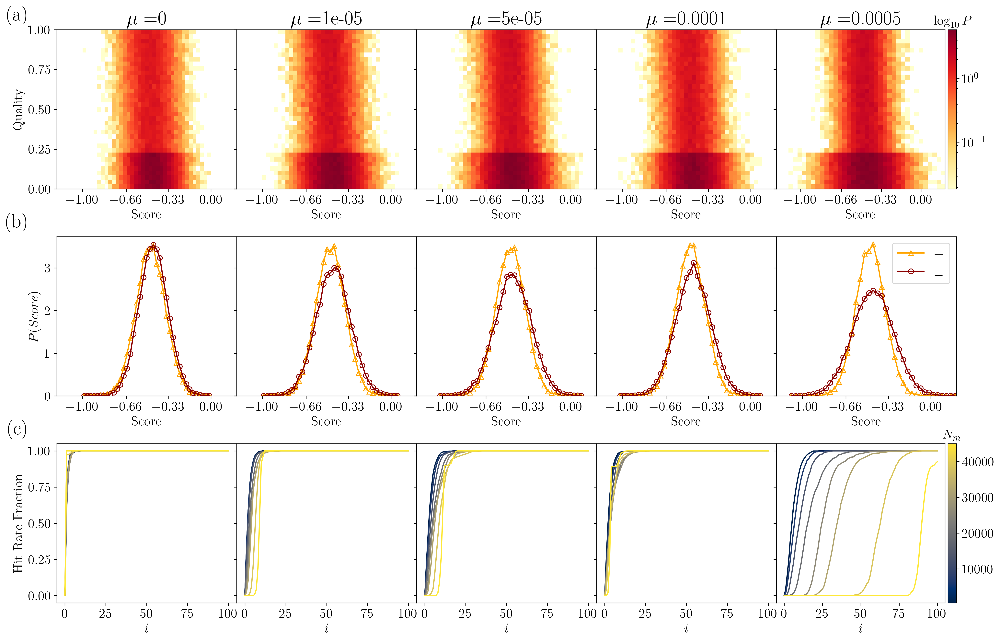

In [79]:
########## Testing the minimum value hit rate hypothesis ##########

from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(3,5, figsize = (17,11), dpi = 300, sharey="row")

from scipy.stats import skew, kurtosis

font_size = 16

cmap = matplotlib.cm.get_cmap("cividis")
color_vals = np.linspace(0,1,8)
colors = [cmap(color_vals[i]) for i in range(8)]

top_ranks = 100
x_axis = range(0, top_ranks + 1)

n_bins = 35

## Plotting the distributions

df_list = min_test_1

fraction_list = [0, 1e-5, 5e-5, 1e-4, 5e-4]

for i in range(5):
    temp_df = df_list[i]
    hh = ax[0,i].hist2d(temp_df["ZRank"], temp_df["DockQ"], bins = n_bins, norm = mcolors.LogNorm(), cmap = "YlOrRd", density = True)
    temp_corr = spearmanr(temp_df["ZRank"], temp_df["DockQ"])[0]
#     ax[0,i].set_title(r"$\rho = $" + str(temp_corr)[:5] + f"; $\sigma ^{2}(+)/\sigma ^{2}(-) = {fraction_list[i]}$", fontsize = font_size)
    ax[0,i].set_title(r"$\mu = $" + f"{fraction_list[i]}", fontsize = font_size+8)

    
## First colorbar 

divider = make_axes_locatable(ax[0,4])
cax1 = divider.append_axes("right", size="5%", pad = 0.05)

cbar_1 = plt.colorbar(hh[3], cax=cax1)
cbar_1.ax.set_title("$\log_{10}P$", fontsize = font_size)
cbar_1.ax.tick_params(labelsize = font_size)
    
    
## Probability distributions of the X axis - POSITIVES

for i in range(5):
    temp_df = df_list[i]
    
    prob_bins = 40

    small_bin = min(min(temp_df[temp_df["DockQ"] >= 0.23]["ZRank"]), min(temp_df[temp_df["DockQ"] < 0.23]["ZRank"]))
    large_bin = max(max(temp_df[temp_df["DockQ"] >= 0.23]["ZRank"]), max(temp_df[temp_df["DockQ"] < 0.23]["ZRank"]))

    norm_bins = np.linspace(small_bin,large_bin, prob_bins)
    
    x = create_prob_dist_identical_bins(temp_df[temp_df["DockQ"] >= 0.23]["ZRank"],
                                        fig, ax[1,i],  color = "orange", bins = norm_bins, 
                                        marker = "^", label = "$+$")
    x = create_prob_dist_identical_bins(temp_df[temp_df["DockQ"] < 0.23]["ZRank"], fig,
                                        ax[1,i],  color = "darkred", bins = norm_bins, 
                                        marker = "o", label = "$-$")
    
    if i == 4:
        ax[1,i].legend(fontsize = font_size)
    
    
## HIT RATE PLOTTING

hit_rate_data_list = min_test_hr_1

for j in range(5):
    for i, sample in enumerate(hit_rate_data_list[j]):
        ax[2,j].plot(x_axis,[0] + list(sample), color = colors[i])
    
## Formatting the axes for the prob distributions

y_tick_list = [0.0, 0.25, 0.5, 0.75, 1.0]
x_tick_list_1 = [-1, -0.66, -0.33, 0.0]
x_tick_list_2 = [0, 25, 50, 75, 100]

for i in range(3):
    for j in range(5):
        if i == 0:
            ax[i,j].set_xlim([-1.2, 0.2])
            ax[i,j].set_yticks(y_tick_list)
            ax[i,j].set_xticks(x_tick_list_1)
        elif i == 1:
            ax[i,j].set_xlim([-1.2, 0.2])
            ax[i,j].set_xticks(x_tick_list_1)
        elif i == 2:
            ax[i,j].set_xlim([-5, 105])
            ax[i,j].set_yticks(y_tick_list)
            ax[i,j].set_xticks(x_tick_list_2)
            
        ax[i,j].tick_params(axis='both', which='major', labelsize=font_size)

    
## Formatting the colorbar

cmap = matplotlib.colormaps['cividis']
norm = matplotlib.colors.Normalize(vmin=500, vmax=45000)
sm = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])


divider = make_axes_locatable(ax[2,4])
cax2 = divider.append_axes("right", size="5%", pad = 0.05)

cbar1 = plt.colorbar(sm, cax = cax2)
cbar1.ax.set_title("$N_m$", fontsize = font_size)
cbar1.ax.tick_params(labelsize = font_size)

## Formatting the titles

ax[0,0].set_ylabel("Quality", fontsize = font_size)
ax[2,0].set_ylabel("Hit Rate Fraction", fontsize = font_size)
ax[1,0].set_ylabel("$P(Score)$", fontsize = font_size)

letters = ["a", "b", "c"]

for i in range(3):
    for j in range(5):
        if i == 0:
            ax[i,j].set_xlabel("Score", fontsize = font_size)
        if i == 1:
            ax[i,j].set_xlabel("Score", fontsize = font_size)
        if i == 2:
            ax[i,j].set_xlabel("$i$", fontsize = font_size)
            
        if j == 0:
            ax[i,j].text(-0.15, 1.15, f"({letters[i]})", transform=ax[i,j].transAxes,fontsize=int(font_size*1.5), fontweight='bold', va='top', ha='right')


    
fig.tight_layout()
fig.subplots_adjust(wspace=0, hspace = 0.3)

plt.savefig(join(figure_save_dir, "sythetic_hitrate_supplement.png"))

## Figure S3

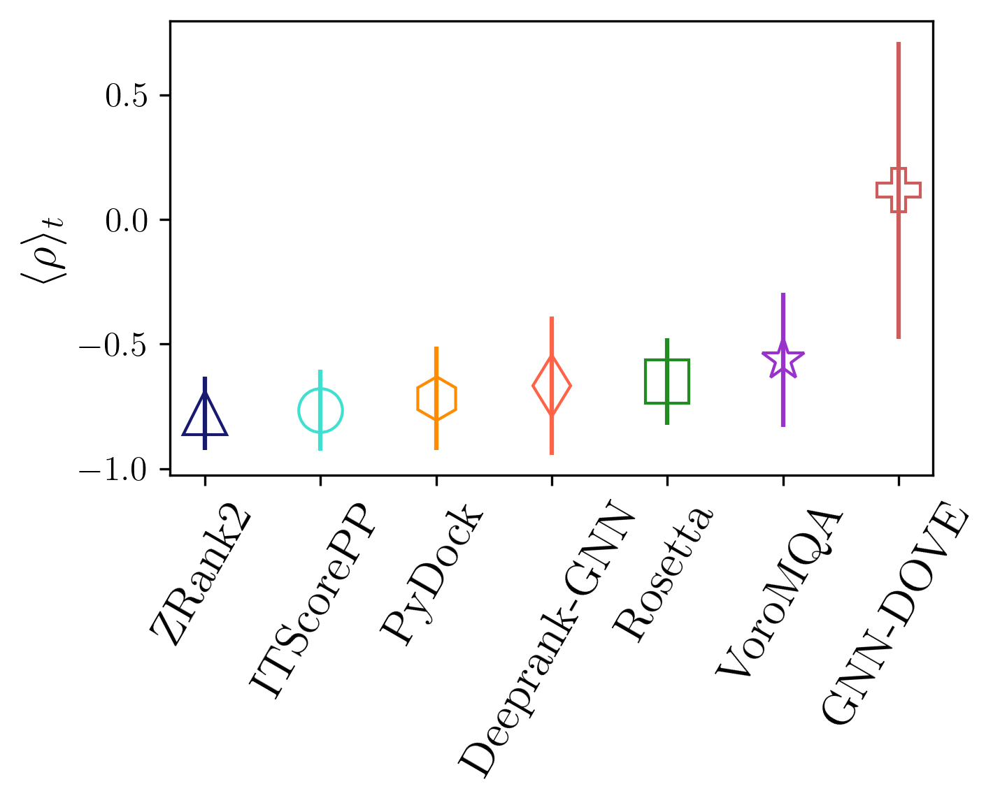

In [82]:
## Show a plot of the average spearman with standard deviation for all scoring methods
## Also showing Deeprank this time:

fig, ax = plt.subplots(figsize = (5,4), dpi = 300)

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

markers = ["^", "o", "s", "h", "*", "P", "d"]

x_axis = range(7)


ss_plot_data = [np.mean(ss_corr_df["spearman_dockq_zrank"]), np.mean(ss_corr_df["spearman_dockq_itscorepp"]),
                    np.mean(ss_corr_df["spearman_dockq_rosetta"]), np.mean(ss_corr_df["spearman_dockq_pydock"]),
                    np.mean(ss_corr_df["spearman_dockq_voromqa"]*-1), np.mean(ss_corr_df["spearman_dockq_dove_5"]),
                    np.mean(ss_corr_df["spearman_dockq_deeprank_gnn_esm"]*-1)]


ss_plot_std = [np.std(ss_corr_df["spearman_dockq_zrank"]), np.std(ss_corr_df["spearman_dockq_itscorepp"]),
                    np.std(ss_corr_df["spearman_dockq_rosetta"]), np.std(ss_corr_df["spearman_dockq_pydock"]),
                    np.std(ss_corr_df["spearman_dockq_voromqa"]*-1), np.std(ss_corr_df["spearman_dockq_dove_5"]),
                      np.std(ss_corr_df["spearman_dockq_deeprank_gnn_esm"]*-1)]

plt.errorbar(x_axis[0], ss_plot_data[0], yerr = ss_plot_std[0], color = colors[0], marker = markers[0], markerfacecolor = "None", markersize = 15)
plt.errorbar(x_axis[1], ss_plot_data[1], yerr = ss_plot_std[1], color = colors[1], marker = markers[1], markerfacecolor = "None", markersize = 15)
plt.errorbar(x_axis[4], ss_plot_data[2], yerr = ss_plot_std[2], color = colors[2], marker = markers[2], markerfacecolor = "None", markersize = 15)
plt.errorbar(x_axis[2], ss_plot_data[3], yerr = ss_plot_std[3], color = colors[3], marker = markers[3], markerfacecolor = "None", markersize = 15)
plt.errorbar(x_axis[5], ss_plot_data[4], yerr = ss_plot_std[4], color = colors[4], marker = markers[4], markerfacecolor = "None", markersize = 15)
plt.errorbar(x_axis[6], ss_plot_data[5], yerr = ss_plot_std[5], color = colors[5], marker = markers[5], markerfacecolor = "None", markersize = 15)
plt.errorbar(x_axis[3], ss_plot_data[6], yerr = ss_plot_std[6], color = colors[6], marker = markers[6], markerfacecolor = "None", markersize = 15)

                              
score_list = ["ZRank2", "ITScorePP", "PyDock", "Deeprank-GNN", "Rosetta", "VoroMQA", "GNN-DOVE"]
plt.xticks(x_axis, score_list, fontsize = 16, rotation = 60)

ax.set_ylabel(r"$\langle \rho \rangle_{t}$", fontsize = 16)
fig.tight_layout()
plt.savefig(join(figure_save_dir, "simple_spearman_graph.png"))

## Figure S4

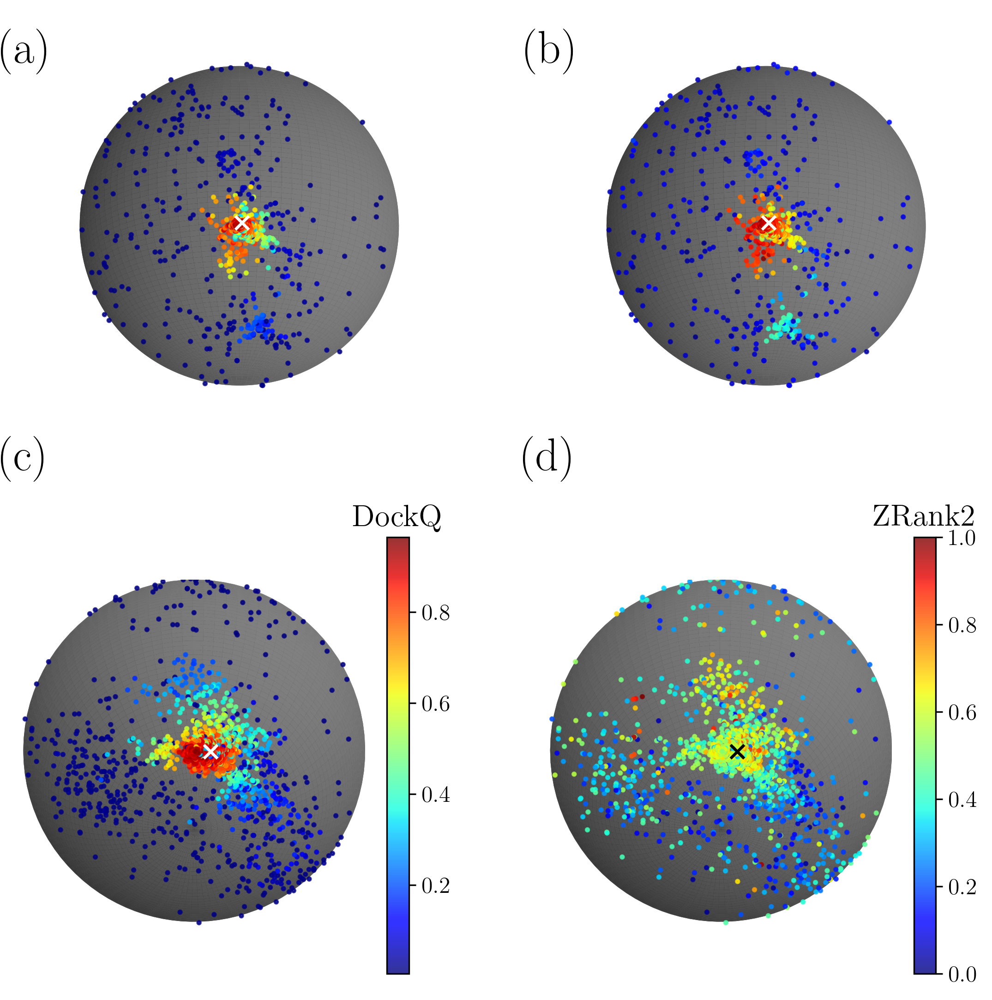

In [84]:
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable

target_row = target_pos[target_pos["Decoy"] == "target"]

def min_max_normalize(array):
    min_val = np.min(array)
    max_val = np.max(array)
    normalized_array = (array - min_val) / (max_val - min_val)
    return normalized_array

x_3whq = 0
y_3whq = 45
z_3whq = 520

x_2grn = 1400
y_2grn = 550
z_2grn = 2000

## 4 panels overall
fig = plt.figure(figsize = (9,9), dpi = 300)

num_samples = len(ss_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

#################
#### Panel A ####

ax = fig.add_subplot(2, 2, 1,projection='3d')

## Get the data

pdb_id = "3whq"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]


## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = temp_pdb_df["DockQ"], 
                      cmap = "jet", alpha = 0.8, s = 3)


scale_factor = 1.5
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "x", color = "white", s = 50)


## Add colorbar

# b_cbar = fig.colorbar(tmp_scat)

# b_cbar.ax.set_title("DockQ", fontsize = fontsize)

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(x_3whq, y_3whq, z = z_3whq, s = "(a)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -20
y_view = 0

ax.view_init(x_view, y_view, "z")


temp_lim = 17.3
blims = -temp_lim
tlims = temp_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

#################
#### Panel B ####

ax = fig.add_subplot(2, 2, 2,projection='3d')

## Get the data

pdb_id = "3whq"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]


## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_zrank = min_max_normalize(temp_pdb_df["ZRank"]*-1)

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = tmp_zrank, 
                      cmap = "jet", alpha = 0.8, s = 3)

## Target Point

scale_factor = 1.5
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "x", color = "white", s = 50)


## Add colorbar

# b_cbar = fig.colorbar(tmp_scat)

# b_cbar.ax.set_title("ZRank2", fontsize = fontsize)

# fig.colorbar(tmp_scat)

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(x_3whq, y_3whq, z = z_3whq, s = "(b)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -20
y_view = 0

ax.view_init(x_view, y_view, "z")


temp_lim = 17.3
blims = -temp_lim
tlims = temp_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims)

#################
#### Panel C ####

ax = fig.add_subplot(2, 2, 3,projection='3d')

## Get the data

pdb_id = "2grn"
temp_pdb_df = complete_vector_dict[pdb_id]
target_pos = vector_dict[pdb_id]


## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = temp_pdb_df["DockQ"], 
                      cmap = "jet", alpha = 0.8, s = 3)


## Target Point

scale_factor = 1.1
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "x", color = "white", s = 50)

## Add colorbar

b_cbar = fig.colorbar(tmp_scat)

b_cbar.ax.set_title("DockQ", fontsize = fontsize)


# fig.colorbar(tmp_scat)

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(x_2grn, y_2grn, z = z_2grn, s = "(c)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -65
y_view = 15

ax.view_init(x_view, y_view, "z")

t_lim = 20
blims = -t_lim
tlims = t_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

#################
#### Panel D ####

ax = fig.add_subplot(2, 2, 4,projection='3d')

## Get the data

pdb_id = "2grn"
temp_pdb_df = complete_vector_dict[pdb_id]

## Normalize the sphere data
target_pos = vector_dict[pdb_id]


## Normalize the sphere data

norm_sphere_df = normalize_point_distance(temp_pdb_df)
norm_target_pos = normalize_point_distance(target_pos)
target_row = norm_target_pos[norm_target_pos["Decoy"] == "target"]

# Create a sphere
r = np.mean(temp_pdb_df["sigma"])-0.25
pi = np.pi
cos = np.cos
sin = np.sin
phi, theta = np.mgrid[0.0:pi:100j, 0.0:2.0*pi:100j]
x = r*sin(phi)*cos(theta)
y = r*sin(phi)*sin(theta)
z = r*cos(phi)
## Plot the spherical surface
ax.plot_surface(x, y, z,  rstride=1, cstride=1, color='gray', alpha=1, linewidth=0)

com_x = norm_sphere_df["com_x"]  
com_y = norm_sphere_df["com_y"]    
com_z = norm_sphere_df["com_z"]

tmp_zrank = min_max_normalize(temp_pdb_df["ZRank"]*-1)

tmp_scat = ax.scatter(com_x, com_y, com_z, marker = "o", facecolor = "None", c = tmp_zrank, 
                      cmap = "jet", alpha = 0.8, s = 3)


## Target Point

scale_factor = 1.1
target_x = target_row["com_x"]* scale_factor
target_y = target_row["com_y"]* scale_factor
target_z = target_row["com_z"]* scale_factor
target_scat = ax.scatter(target_x, target_y, target_z, marker = "x", color = "black", s = 50)

## Add colorbar

b_cbar = fig.colorbar(tmp_scat)

b_cbar.ax.set_title("ZRank2", fontsize = fontsize)

ax.set_box_aspect([1,1,1])
ax.set_axis_off()

ax.tick_params(axis='both', which='major', labelsize=font_size)
ax.text(x_2grn, y_2grn, z = z_2grn, s = "(d)", transform=ax.transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')

## Set the initial view angle

x_view = -65
y_view = 15

ax.view_init(x_view, y_view, "z")

t_lim = 20
blims = -t_lim
tlims = t_lim
ax.axes.set_xlim3d(left=blims, right=tlims) 
ax.axes.set_ylim3d(bottom=blims, top=tlims) 
ax.axes.set_zlim3d(bottom=blims, top=tlims) 

plt.savefig(join(figure_save_dir, "easy_hard_sphere_fig.png"))

## Figure S5

84
a: 0.5089127330596144
b: -0.670330146108695
c: 0.591975485361968
d: -0.6547405064140099


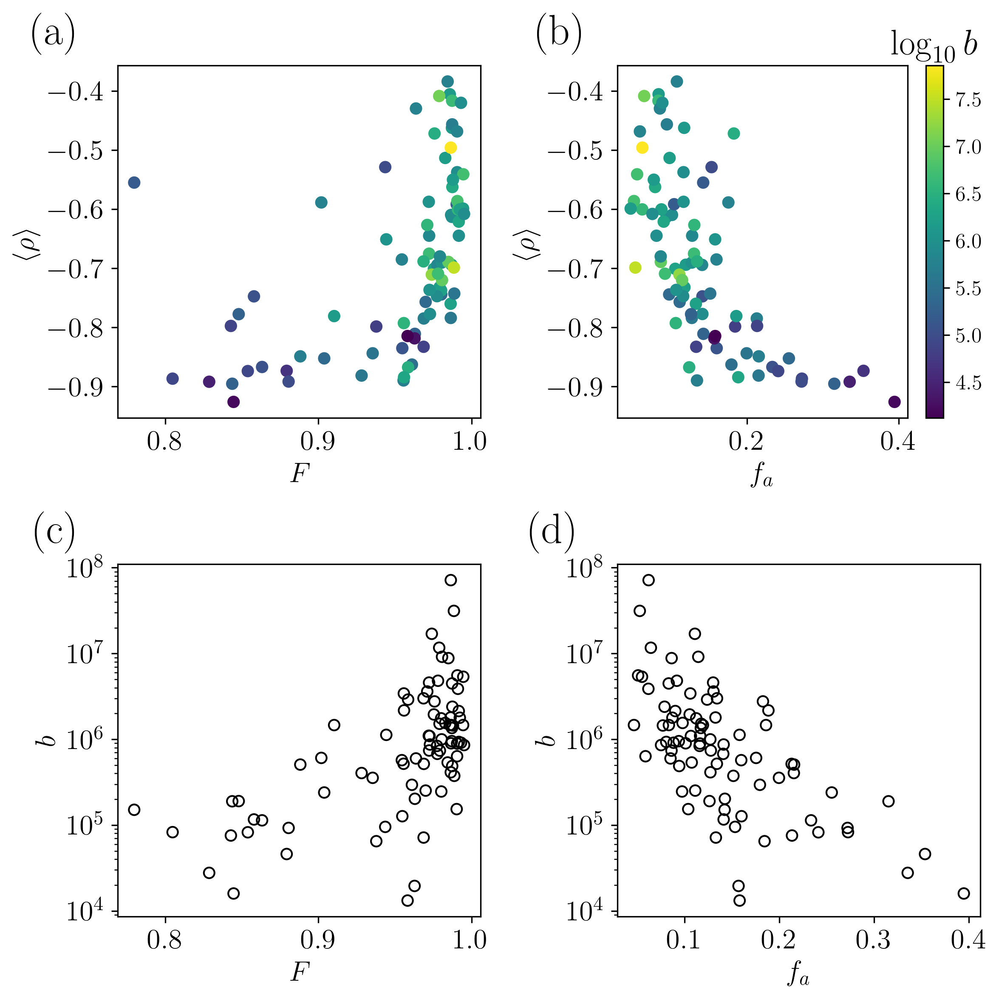

In [91]:
## Final Flatness Correlation Figure

fig, ax = plt.subplots(2,2,figsize = (8,8), dpi = 300)

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

font_size = 16

#### Panel A ####

flatness_avg = [
    np.array(ss_corr_df["spearman_dockq_zrank"]), np.array(ss_corr_df["spearman_dockq_itscorepp"]), 
    np.array(ss_corr_df["spearman_dockq_rosetta"]), ss_corr_df["spearman_dockq_pydock"], 
    np.array(ss_corr_df["spearman_dockq_voromqa"])*-1, np.array(ss_corr_df["spearman_dockq_deeprank_gnn_esm"])*-1
]

flatness_avg = np.array(flatness_avg)
flatness_std = np.std(flatness_avg, axis = 0)
flatness_avg = np.mean(flatness_avg, axis = 0)
print(len(flatness_avg))

# ax[0].errorbar(ss_corr_df["flatness_p3"], flatness_avg, yerr = flatness_std/3, color = "black", marker = "o",  
#                markerfacecolor = "None", ls = "None", alpha = 0.6, capsize = 3)


c_obj = ax[0,0].scatter(ss_corr_df["flatness_p3"], flatness_avg, c = np.log10(aspher_list), marker = "o",  
               facecolor = "None", ls = "None", alpha = 1)

ax[0,0].set_xlabel("$F$", fontsize = font_size)
ax[0,0].set_ylabel(r"$\langle \rho \rangle$", fontsize = font_size)

#### Panel B ####

# ax[1].errorbar(ss_corr_df["relative_interface_sasa"], flatness_avg, yerr = flatness_std/3, color = "black", marker = "o",  
#                markerfacecolor = "None", ls = "None", alpha = 0.6, capsize = 3)


c_obj = ax[0,1].scatter(ss_corr_df["relative_interface_sasa"], flatness_avg, c = np.log10(aspher_list), marker = "o",  
               facecolor = "None", ls = "None", alpha = 1)

cbar = fig.colorbar(c_obj, ax = ax[0,1])

cbar.ax.set_title("$\log_{10}b$", fontsize = 20)


ax[0,1].set_xlabel("$f_{a}$", fontsize = font_size)
ax[0,1].set_ylabel(r"$\langle \rho \rangle$", fontsize = font_size)

#### Panel C ####

ax[1,0].scatter(ss_corr_df["flatness_p3"], aspher_list, color = "black", marker = "o",  
               facecolor = "None", ls = "None", alpha = 1)



ax[1,0].set_xlabel("$F$", fontsize = font_size)
ax[1,0].set_ylabel(r"$b$", fontsize = font_size)


#### Panel D ####

ax[1,1].scatter(ss_corr_df["relative_interface_sasa"], aspher_list, color = "black", marker = "o",  
               facecolor = "None", ls = "None", alpha = 1)



ax[1,1].set_xlabel("$f_{a}$", fontsize = font_size)
ax[1,1].set_ylabel(r"$b$", fontsize = font_size)

#### Formatting ####

letters = [['a', 'b'], ['c', 'd']]
for i in range(2):
    for j in range(2):
        ax[i,j].text(-0.1, 1.15, f"({letters[i][j]})", transform=ax[i,j].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
        ax[i,j].tick_params(axis='both', which='major', labelsize=font_size)
        
        
ax[1,0].set_yscale("log")
ax[1,1].set_yscale("log")
        
        
## Print Shit

print("a:", pearsonr(ss_corr_df["flatness_p3"], flatness_avg)[0])
print("b:", pearsonr(ss_corr_df["relative_interface_sasa"], flatness_avg)[0])
print("c:", pearsonr(ss_corr_df["flatness_p3"], np.log10(aspher_list))[0])
print("d:", pearsonr(ss_corr_df["relative_interface_sasa"], np.log10(aspher_list))[0])


fig.tight_layout()
plt.savefig(join(figure_save_dir, "flatness_and_rel_interface_with_asphericity.png"))

## Figure S6

In [88]:
score_ref = ["spearman_dockq_zrank", "spearman_dockq_intertwined", "spearman_dockq_contact_45",
             "spearman_dockq_interface_rsa", "spearman_pca", "svr_rbf_spearman"]
spearman_data = np.zeros((len(score_ref),num_samples))

for i in range(len(score_ref)):
    for j in range(num_samples):
        if "contact" in score_ref[i] or "interface" in score_ref[i]:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j] * -1
        elif "pca" in score_ref[i]:
            spearman_data[i][j] = physical_pca_df[score_ref[i]].iloc[j]
        elif "svr" in score_ref[i]:
            spearman_data[i][j] = svr_overall_df[score_ref[i]].iloc[j] *-1
        else:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j]


mean_data = np.mean(spearman_data, axis = 0)

stdev_data = np.std(spearman_data, axis = 0)

sorted_data = spearman_data[:, mean_data.argsort()]

sorted_mean_data = mean_data[mean_data.argsort()]

sorted_stdev_data = stdev_data[mean_data.argsort()]

In [89]:
## Run the previous cell and then this one

physical_sorted_data = sorted_data
physical_sorted_mean_data = sorted_mean_data
physical_sorted_stdev_data = sorted_stdev_data

['3whq', '1ugq', '1n1j', '4uzz', '1kfu', '4g6t', '5k7m', '1c3a', '5by8', '1r8o', '4ct6', '4qjf', '1vet', '3vz9', '5maw', '3dgp', '1pdk', '1f60', '2wmp', '4je3', '1ugh', '2bkr', '8enf', '2oul', '2fhz', '1spp', '5dmb', '5mu7', '3wdg', '4h5s', '2hla', '1ry7', '5uq2', '3gfk', '6zbk', '4gi3', '7joe', '3qc8', '4yii', '4dbg', '7bxh', '1acb', '4u1c', '1euv', '1ay7', '1ggp', '3rcz', '4bi8', '1tfo', '6yxj', '1qav', '1wqj', '2pe6', '2g2u', '4k12', '5zrz', '1j7d', '1wrd', '7jxv', '6xod', '4dhi', '6kp3', '1xg2', '4qlp', '3sgb', '4hwi', '2hth', '1itb', '6wg4', '3k9p', '3fpn', '2dvw', '3qhy', '3u82', '6fud', '3hw2', '1wmh', '2hsm', '3ona', '3ygs', '2h7z', '2grn', '2d5r', '1mbv']


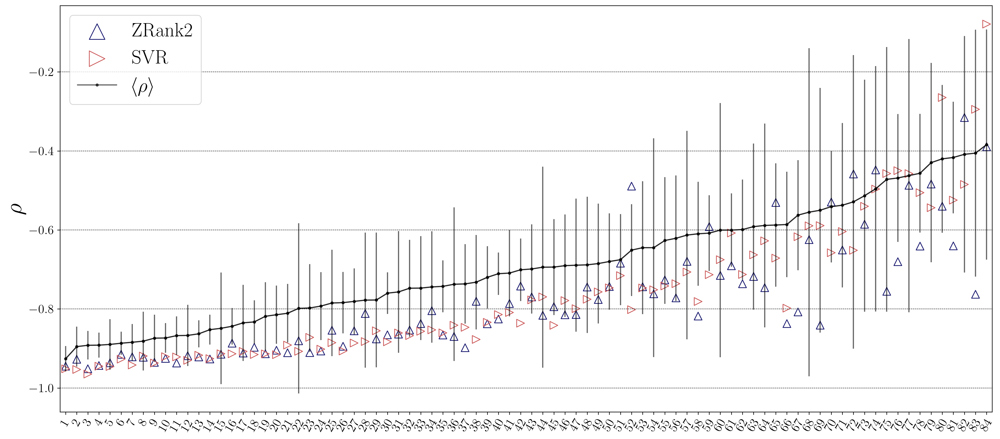

In [90]:
## Only scores that do well now

num_samples = len(ss_corr_df)
colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]



score_ref = ["spearman_dockq_zrank", "spearman_dockq_itscorepp", "spearman_dockq_rosetta",
             "spearman_dockq_pydock", "spearman_dockq_voromqa","spearman_dockq_deeprank_gnn_esm"]
spearman_data = np.zeros((len(score_ref),num_samples))

for i in range(len(score_ref)):
    for j in range(num_samples):
        if "deeprank" in score_ref[i] or "voromqa" in score_ref[i]:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j] * -1
        else:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j]

fig, ax = plt.subplots(figsize = (18,8), dpi = 300)

mean_data = np.mean(spearman_data, axis = 0)

stdev_data = np.std(spearman_data, axis = 0)

sorted_data = spearman_data[:, mean_data.argsort()]

sorted_mean_data = mean_data[mean_data.argsort()]

sorted_stdev_data = stdev_data[mean_data.argsort()]


pdb_order = list(np.array(ss_corr_df["pdb"])[mean_data.argsort()])
print(pdb_order)
label_ticks = list(range(1, len(ss_corr_df)+1))
x = np.linspace(0.5, num_samples-0.5, num_samples)
plt.xticks(x, label_ticks)
plt.xticks(rotation = 60, fontsize = 16)
plt.yticks(fontsize = 16)
plt.xlim(0, num_samples)

marker_size = 100

ax.scatter(x, physical_sorted_data[0], color = colors[0], marker = "^", label = "ZRank2", facecolor = "None", s = marker_size)
ax.scatter(x, physical_sorted_data[5], color = colors[5], marker = ">", label = "SVR", facecolor = "None", s = marker_size)

plt.errorbar(x, sorted_mean_data, yerr = sorted_stdev_data, color = "black", marker = ".", alpha = 0.6)
plt.plot(x, sorted_mean_data, color = "black", marker = ".", alpha = 0.6, label = r"$\langle \rho \rangle$")

ax.set_ylabel(r"$\rho$", fontsize = 30)

fig.tight_layout()
lgnd = plt.legend(fontsize = 25)
lgnd.legendHandles[0]._sizes = [400]
lgnd.legendHandles[1]._sizes = [400]
lgnd.legendHandles[2]._sizes = [400]

plt.grid(axis = "y", color = 'black', linestyle = '--', linewidth = 0.5)
# plt.savefig(join(figure_save_dir, "per_target_spearman_no_dove.png"))
plt.savefig(join(figure_save_dir, "per_target_spearman_zrank_and_svr.png"))

## Figure S7

(0.17796028032707273, 0.10532901726059017)


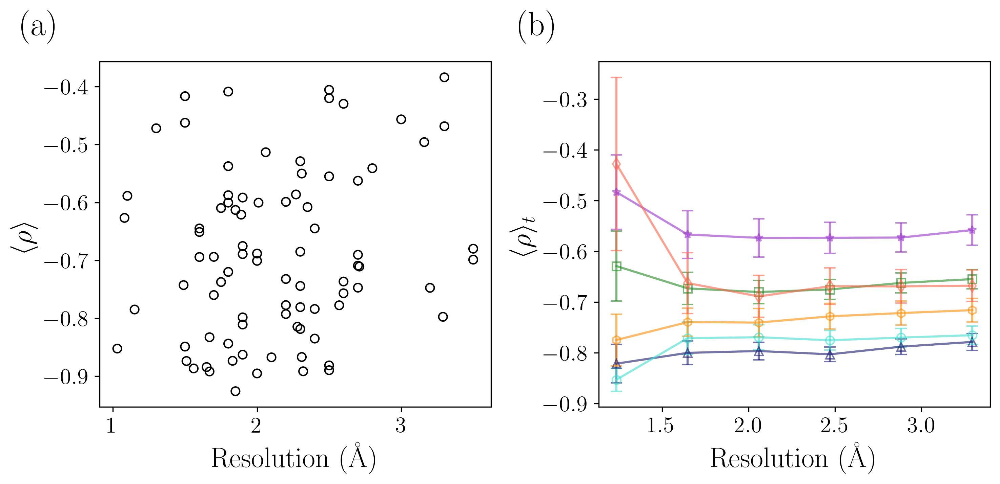

In [83]:
## Combined Resolution Figure

fig, ax = plt.subplots(1,2, figsize = (10,5), dpi = 300)

colors = ["midnightblue", "turquoise", "forestgreen", "darkorange", "darkorchid", "indianred", "tomato"]

font_size = 16

def get_rolling_avg(datax, datay, nbins):
    '''
    Gets the rolling average of the datay over
    nbins of the datax. 
    '''

    bins = np.linspace(min(datax), max(datax), nbins+1)
    avg_data = np.zeros((nbins))
    std_data = np.zeros((nbins))
    
    for i in range(nbins):
        temp_data = datay[(datax >= bins[0]) & (datax < bins[i+1])]
        avg_data[i] = np.mean(temp_data)
        std_data[i] = np.std(temp_data)/np.sqrt(len(temp_data)) ## standard error
#         std_data[i] = np.std(temp_data)
        
    bin_step = bins[1] - bins[0]
    cent_bins = [ele + 0.5*bin_step for ele in bins][:nbins]
        
    return cent_bins, avg_data, std_data

## Get rolling average data for Spearman Correlation based on the resolution

nbins = 6

zrank_x, zrank_y, zrank_err = get_rolling_avg(ss_corr_df["resolution"], ss_corr_df["spearman_dockq_zrank"], nbins)
hdock_x, hdock_y, hdock_err = get_rolling_avg(ss_corr_df["resolution"], ss_corr_df["spearman_dockq_itscorepp"], nbins)
rosetta_x, rosetta_y, rosetta_err = get_rolling_avg(ss_corr_df["resolution"], ss_corr_df["spearman_dockq_rosetta"], nbins)
pydock_x, pydock_y, pydock_err = get_rolling_avg(ss_corr_df["resolution"], ss_corr_df["spearman_dockq_pydock"], nbins)
deeprank_x, deeprank_y , deeprank_err = get_rolling_avg(ss_corr_df["resolution"], ss_corr_df["spearman_dockq_deeprank_gnn_esm"], nbins)
voromqa_x, voromqa_y , voromqa_err = get_rolling_avg(ss_corr_df["resolution"], ss_corr_df["spearman_dockq_voromqa"], nbins)

deeprank_y = deeprank_y * -1
voromqa_y = voromqa_y * -1

## Resolution Scatterplot


score_ref = ["spearman_dockq_zrank", "spearman_dockq_itscorepp", "spearman_dockq_rosetta", "spearman_dockq_pydock", 
             "spearman_dockq_deeprank_gnn_esm", "spearman_dockq_voromqa"]
spearman_data = np.zeros((len(score_ref),len(ss_corr_df)))

for i in range(len(score_ref)):
    for j in range(len(ss_corr_df)):
        if i >= 4:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j] * -1
        else:
            spearman_data[i][j] = ss_corr_df[score_ref[i]].iloc[j]

mean_data_ss = np.mean(spearman_data, axis = 0)

ax[0].scatter(ss_corr_df["resolution"], mean_data_ss, color = "black", marker = "o", label = "Supersampled", facecolor = "None")

ax[0].set_xlabel("Resolution (Å)", fontsize = 20)
ax[0].set_ylabel(r"$\langle \rho \rangle$", fontsize = 20)

print(pearsonr(ss_corr_df["resolution"], mean_data_ss))

## Relaxed and Supersampled

ax[1].errorbar(zrank_x, zrank_y, yerr = zrank_err, color = colors[0], marker = "^",  markerfacecolor = "None", label = "ZRank2", alpha = 0.6, solid_capstyle = "projecting", capsize = 4)
ax[1].errorbar(hdock_x, hdock_y, yerr = hdock_err, color = colors[1], marker = "o", markerfacecolor = "None", label = "ITScorePP", alpha = 0.6, solid_capstyle = "projecting", capsize = 4)
ax[1].errorbar(rosetta_x, rosetta_y, yerr = rosetta_err, color = colors[2], marker = "s", markerfacecolor = "None", label = "Rosetta", alpha = 0.6, solid_capstyle = "projecting", capsize = 4)
ax[1].errorbar(pydock_x, pydock_y, yerr = pydock_err, color = colors[3], marker = "h", markerfacecolor = "None", label = "PyDock", alpha = 0.6, solid_capstyle = "projecting", capsize = 4)
ax[1].errorbar(voromqa_x, voromqa_y, yerr = voromqa_err, color = colors[4], marker = "*", markerfacecolor = "None", label = "VoroMQA", alpha = 0.6, solid_capstyle = "projecting", capsize = 4)
ax[1].errorbar(deeprank_x, deeprank_y, yerr = deeprank_err, color = colors[6], marker = "d", markerfacecolor = "None", label = "Deeprank-GNN", alpha = 0.6, solid_capstyle = "projecting", capsize = 4)

ax[1].set_xlabel("Resolution (Å)", fontsize = 20)
ax[1].set_ylabel(r"$\langle \rho \rangle_{t}$", fontsize = 20)

ax[0].text(-0.1, 1.15, "(a)", transform=ax[0].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[1].text(-0.1, 1.15, "(b)", transform=ax[1].transAxes,fontsize=font_size*1.5, fontweight='bold', va='top', ha='right')
ax[0].tick_params(axis='both', which='major', labelsize=font_size)
ax[1].tick_params(axis='both', which='major', labelsize=font_size)

fig.tight_layout()
plt.savefig(join(figure_save_dir, "resolution_combined_fig.png"))